### Exploratory data analysis / data cleaning on the training dataset

#### Importing the libraries

In [98]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

#### Loading the dataset

In [99]:
from sqlalchemy import create_engine
import pandas as pd
import dotenv
import os

dotenv.load_dotenv()

user = os.getenv("DB_USERNAME")
password = os.getenv("DB_PASSWORD")
host = os.getenv("DB_HOST")
port = os.getenv("DB_PORT")
database = os.getenv("DB_NAME")

engine = create_engine(
    f"postgresql+psycopg2://{user}:{password}@{host}:{port}/{database}"
)

print(user, host, port, database)

postgres localhost 5432 store-sales


In [100]:
import psycopg2
import pandas as pd

conn = psycopg2.connect(
    host=os.getenv("DB_HOST"),
    database=os.getenv("DB_NAME"),
    user=os.getenv("DB_USERNAME"),
    password=os.getenv("DB_PASSWORD"),
    port=os.getenv("DB_PORT")
)

query="SELECT * FROM raw.train;"
chunks = []

for chunk in pd.read_sql(query, conn, chunksize=50000):
    chunks.append(chunk)

dataset_train = pd.concat(chunks, ignore_index=True)

dataset_train.head()

,store,dept,date,weekly_sales,isholiday
0,1,1,2010-02-05,24924.50,False
1,1,1,2010-02-12,46039.49,True
2,1,1,2010-02-19,41595.55,False
3,1,1,2010-02-26,19403.54,False
4,1,1,2010-03-05,21827.90,False


In [101]:
len(dataset_train['store'].unique())

45

In [102]:
len(dataset_train['dept'].unique())

81

In [103]:
dataset_train.isna().sum()

store           0
dept            0
date            0
weekly_sales    0
isholiday       0
dtype: int64

In [104]:
dataset_train['date']=pd.to_datetime(dataset_train['date'])

In [105]:
print(dataset_train.describe())
dataset_train.shape

               store           dept                           date  \
count  421570.000000  421570.000000                         421570   
mean       22.200546      44.260317  2011-06-18 08:30:31.963375104   
min         1.000000       1.000000            2010-02-05 00:00:00   
25%        11.000000      18.000000            2010-10-08 00:00:00   
50%        22.000000      37.000000            2011-06-17 00:00:00   
75%        33.000000      74.000000            2012-02-24 00:00:00   
max        45.000000      99.000000            2012-10-26 00:00:00   
std        12.785297      30.492054                            NaN   

        weekly_sales  
count  421570.000000  
mean    15981.258123  
min     -4988.940000  
25%      2079.650000  
50%      7612.030000  
75%     20205.852500  
max    693099.360000  
std     22711.183519  


(421570, 5)

#### Time ranges for different Store,Department pairs

In [106]:
time_range_df = (
    dataset_train
    .groupby(['store', 'dept'])['date']
    .agg(start_date='min', end_date='max')
    .reset_index()
)

print(time_range_df)

      store  dept start_date   end_date
0         1     1 2010-02-05 2012-10-26
1         1     2 2010-02-05 2012-10-26
2         1     3 2010-02-05 2012-10-26
3         1     4 2010-02-05 2012-10-26
4         1     5 2010-02-05 2012-10-26
5         1     6 2010-02-05 2012-10-26
6         1     7 2010-02-05 2012-10-26
7         1     8 2010-02-05 2012-10-26
8         1     9 2010-02-05 2012-10-26
9         1    10 2010-02-05 2012-10-26
10        1    11 2010-02-05 2012-10-26
11        1    12 2010-02-05 2012-10-26
12        1    13 2010-02-05 2012-10-26
13        1    14 2010-02-05 2012-10-26
14        1    16 2010-02-05 2012-10-26
15        1    17 2010-02-05 2012-10-26
16        1    18 2010-02-05 2012-10-26
17        1    19 2010-02-05 2012-10-26
18        1    20 2010-02-05 2012-10-26
19        1    21 2010-02-05 2012-10-26
20        1    22 2010-02-05 2012-10-26
21        1    23 2010-02-05 2012-10-26
22        1    24 2010-02-05 2012-10-26
23        1    25 2010-02-05 2012-10-26


In [107]:
store_time_range = (
    time_range_df
    .groupby('store')
    .agg(
        store_start_date=('start_date', 'min'),
        store_end_date=('end_date', 'max')
    )
    .reset_index()
)

print(store_time_range)

    store store_start_date store_end_date
0       1       2010-02-05     2012-10-26
1       2       2010-02-05     2012-10-26
2       3       2010-02-05     2012-10-26
3       4       2010-02-05     2012-10-26
4       5       2010-02-05     2012-10-26
5       6       2010-02-05     2012-10-26
6       7       2010-02-05     2012-10-26
7       8       2010-02-05     2012-10-26
8       9       2010-02-05     2012-10-26
9      10       2010-02-05     2012-10-26
10     11       2010-02-05     2012-10-26
11     12       2010-02-05     2012-10-26
12     13       2010-02-05     2012-10-26
13     14       2010-02-05     2012-10-26
14     15       2010-02-05     2012-10-26
15     16       2010-02-05     2012-10-26
16     17       2010-02-05     2012-10-26
17     18       2010-02-05     2012-10-26
18     19       2010-02-05     2012-10-26
19     20       2010-02-05     2012-10-26
20     21       2010-02-05     2012-10-26
21     22       2010-02-05     2012-10-26
22     23       2010-02-05     201

In [108]:
final_time_range = (
    store_time_range
    .agg(
        final_start_date=('store_start_date', 'min'),
        final_end_date=('store_end_date', 'max')
    )
    .reset_index()
)

print(final_time_range)

              index store_start_date store_end_date
0  final_start_date       2010-02-05            NaT
1    final_end_date              NaT     2012-10-26


#### Now we will fill the time gaps that are present in the dataset_train dataframe to imitate a complete data for training

In [109]:
dataset_train['date'] = pd.to_datetime(dataset_train['date'])

In [110]:
full_dates = pd.date_range(
    start='2010-02-05',
    end='2012-10-26',
    freq='W-FRI'   # Walmart dataset → weekly Friday
)
pd.set_option('display.max_rows', None)
full_dates

DatetimeIndex(['2010-02-05', '2010-02-12', '2010-02-19', '2010-02-26',
               '2010-03-05', '2010-03-12', '2010-03-19', '2010-03-26',
               '2010-04-02', '2010-04-09',
               ...
               '2012-08-24', '2012-08-31', '2012-09-07', '2012-09-14',
               '2012-09-21', '2012-09-28', '2012-10-05', '2012-10-12',
               '2012-10-19', '2012-10-26'],
              dtype='datetime64[ns]', length=143, freq='W-FRI')

In [111]:
stores = dataset_train['store'].unique()
depts = dataset_train['dept'].unique()

full_index = pd.MultiIndex.from_product(
    [stores, depts, full_dates],
    names=['store', 'dept', 'date']
)

full_df = pd.DataFrame(index=full_index).reset_index()

In [112]:
full_df.head()

,store,dept,date
0,1,1,2010-02-05
1,1,1,2010-02-12
2,1,1,2010-02-19
3,1,1,2010-02-26
4,1,1,2010-03-05


In [113]:
dataset_train_full = full_df.merge(
    dataset_train,
    on=['store', 'dept', 'date'],
    how='left'
)


In [114]:
dataset_train_full.isna().sum()

store               0
dept                0
date                0
weekly_sales    99665
isholiday       99665
dtype: int64

In [115]:
dataset_train_full['weekly_sales'] = dataset_train_full['weekly_sales'].fillna(0)
dataset_train_full['isholiday'] = dataset_train_full['isholiday'].fillna(False)

In [116]:
dataset_train_full = (
    dataset_train_full
    .sort_values(['store', 'dept', 'date'])
    .reset_index(drop=True)
)


In [117]:
dataset_train_full.isna().sum()

store           0
dept            0
date            0
weekly_sales    0
isholiday       0
dtype: int64

In [118]:
expected_rows = (
    len(stores)
    * len(depts)
    * len(full_dates)
)

print(expected_rows, len(dataset_train_full))


521235 521235


In [119]:
dataset_train_full.groupby(['store'])['date'].agg(unique_start_date='min', unique_end_date='max')

,unique_start_date,unique_end_date
store,,
1,2010-02-05,2012-10-26
2,2010-02-05,2012-10-26
3,2010-02-05,2012-10-26
4,2010-02-05,2012-10-26
5,2010-02-05,2012-10-26
6,2010-02-05,2012-10-26
7,2010-02-05,2012-10-26
8,2010-02-05,2012-10-26
9,2010-02-05,2012-10-26


In [120]:
dataset_train_full.isna().sum()

store           0
dept            0
date            0
weekly_sales    0
isholiday       0
dtype: int64

#### Date values where IsHoliday Feature column is true. Meaning that the week is considered Holiday Week

In [121]:
dataset_train['date']=pd.to_datetime(dataset_train['date'])
holiday_dates=dataset_train[dataset_train['isholiday']==True]['date'].unique()

#### We need to set the values of some of the dates to true depending on whether it is present in the above vector or not

In [122]:
dataset_train_full['isholiday'].value_counts()

isholiday
False    491574
True      29661
Name: count, dtype: int64

In [123]:
dataset_train_full['isholiday'] = dataset_train_full['date'].isin(holiday_dates)

In [124]:
dataset_train_full['isholiday'].value_counts()

isholiday
False    484785
True      36450
Name: count, dtype: int64

#### Analysis of dataset_features starts

In [125]:
from sqlalchemy import create_engine
import pandas as pd
import dotenv
import os

dotenv.load_dotenv()

user = os.getenv("DB_USERNAME")
password = os.getenv("DB_PASSWORD")
host = os.getenv("DB_HOST")
port = os.getenv("DB_PORT")
database = os.getenv("DB_NAME")

engine = create_engine(
    f"postgresql+psycopg2://{user}:{password}@{host}:{port}/{database}"
)

print(user, host, port, database)

postgres localhost 5432 store-sales


In [126]:
import psycopg2
import pandas as pd

conn = psycopg2.connect(
    host=os.getenv("DB_HOST"),
    database=os.getenv("DB_NAME"),
    user=os.getenv("DB_USERNAME"),
    password=os.getenv("DB_PASSWORD"),
    port=os.getenv("DB_PORT")
)

query="SELECT * FROM clean.features;"
dataset_features = pd.read_sql(query, conn)

dataset_features.head()


,store,date,temperature,fuel_price,markdown1,markdown2,markdown3,markdown4,markdown5,total_markdown,cpi,unemployment,isholiday
0,1,2010-02-05,42.31,2.572,0.0,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False
1,1,2010-02-12,38.51,2.548,0.0,0.0,0.0,0.0,0.0,0.0,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,0.0,0.0,0.0,0.0,0.0,0.0,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,0.0,0.0,0.0,0.0,0.0,0.0,211.319643,8.106,False
4,1,2010-03-05,46.50,2.625,0.0,0.0,0.0,0.0,0.0,0.0,211.350143,8.106,False


In [127]:
dataset_features.dtypes

store               int64
date               object
temperature       float64
fuel_price        float64
markdown1         float64
markdown2         float64
markdown3         float64
markdown4         float64
markdown5         float64
total_markdown    float64
cpi               float64
unemployment      float64
isholiday            bool
dtype: object

In [128]:
dataset_features.isna().sum()

store               0
date                0
temperature         0
fuel_price          0
markdown1           0
markdown2           0
markdown3           0
markdown4           0
markdown5           0
total_markdown      0
cpi               585
unemployment      585
isholiday           0
dtype: int64

In [129]:
print(dataset_features.describe())
dataset_features.shape

             store  temperature   fuel_price      markdown1      markdown2  \
count  8190.000000  8190.000000  8190.000000    8190.000000    8190.000000   
mean     23.000000    59.356198     3.405992    3462.090725    1206.981664   
std      12.987966    18.678607     0.431337    7388.916286    5495.556015   
min       1.000000    -7.290000     2.472000   -2781.450000    -265.760000   
25%      12.000000    45.902500     3.041000       0.000000       0.000000   
50%      23.000000    60.710000     3.513000       0.000000       0.000000   
75%      34.000000    73.880000     3.743000    4639.585000      98.590000   
max      45.000000   101.950000     4.468000  103184.980000  104519.540000   

           markdown3     markdown4      markdown5  total_markdown  \
count    8190.000000   8190.000000    8190.000000     8190.000000   
mean      776.464219   1392.763115    2043.403725     8881.703448   
std      7539.953758   4707.111488    9431.223215    19084.538888   
min      -179.260000 

(8190, 13)

In [130]:
print(dataset_features['store'].unique())
len(dataset_features['store'].unique())

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 44 31 32 33 34 35 36 37 38 39 40 41 42 43 45]


45

In [131]:
dataset_features['date']=pd.to_datetime(dataset_features['date'])

#### Calculating the time ranges for each of the stores

In [132]:
dataset_features=dataset_features.sort_values(by=['store','date']).reset_index(drop=True)
feature_time_range_df=dataset_features.groupby(by=['store'])['date'].agg(lambda x: (x.min(),x.max()))
feature_time_range_df

store
1     (2010-02-05 00:00:00, 2013-07-26 00:00:00)
2     (2010-02-05 00:00:00, 2013-07-26 00:00:00)
3     (2010-02-05 00:00:00, 2013-07-26 00:00:00)
4     (2010-02-05 00:00:00, 2013-07-26 00:00:00)
5     (2010-02-05 00:00:00, 2013-07-26 00:00:00)
6     (2010-02-05 00:00:00, 2013-07-26 00:00:00)
7     (2010-02-05 00:00:00, 2013-07-26 00:00:00)
8     (2010-02-05 00:00:00, 2013-07-26 00:00:00)
9     (2010-02-05 00:00:00, 2013-07-26 00:00:00)
10    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
11    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
12    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
13    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
14    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
15    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
16    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
17    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
18    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
19    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
20    (2010-02-05 00:00:00, 2013-07-26 00:00:00)
21    (2010-02

#### Checking if the values of the date feature column is using a weekly pattern or not

In [133]:
dataset_features['date_diff'] = dataset_features.groupby('store')['date'].diff()
weekly_gaps = dataset_features[dataset_features['date_diff'] != pd.Timedelta(days=7)]

# weekly_gaps will show all rows where the weekly gap is broken
print(weekly_gaps)

      store       date  temperature  fuel_price  markdown1  markdown2  \
0         1 2010-02-05        42.31       2.572        0.0        0.0   
182       2 2010-02-05        40.19       2.572        0.0        0.0   
364       3 2010-02-05        45.71       2.572        0.0        0.0   
546       4 2010-02-05        43.76       2.598        0.0        0.0   
728       5 2010-02-05        39.70       2.572        0.0        0.0   
910       6 2010-02-05        40.43       2.572        0.0        0.0   
1092      7 2010-02-05        10.53       2.580        0.0        0.0   
1274      8 2010-02-05        34.14       2.572        0.0        0.0   
1456      9 2010-02-05        38.01       2.572        0.0        0.0   
1638     10 2010-02-05        54.34       2.962        0.0        0.0   
1820     11 2010-02-05        46.04       2.572        0.0        0.0   
2002     12 2010-02-05        49.47       2.962        0.0        0.0   
2184     13 2010-02-05        31.53       2.666    

#### This output means that the date column is clean in terms of not having any weekly breaks in the time ranges for any of the store

In [134]:
dataset_features.drop(columns=['date_diff'],inplace=True)

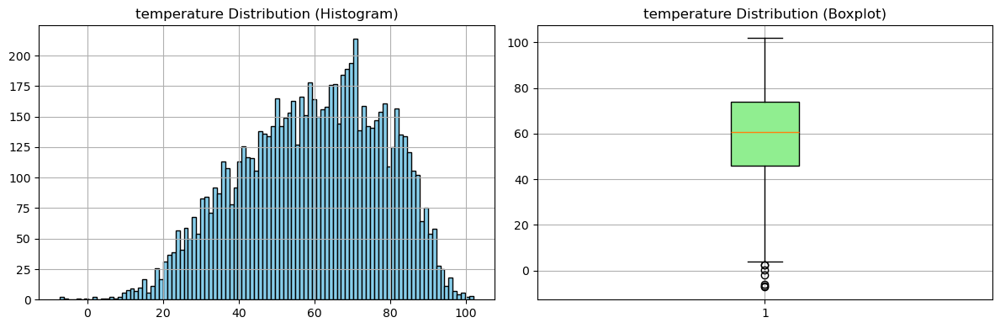

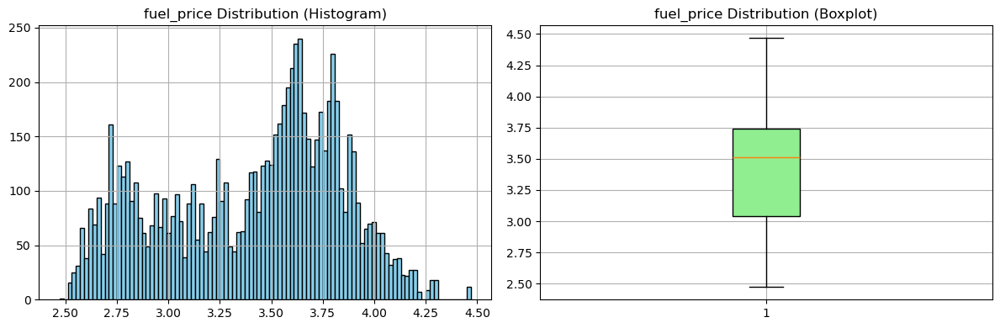

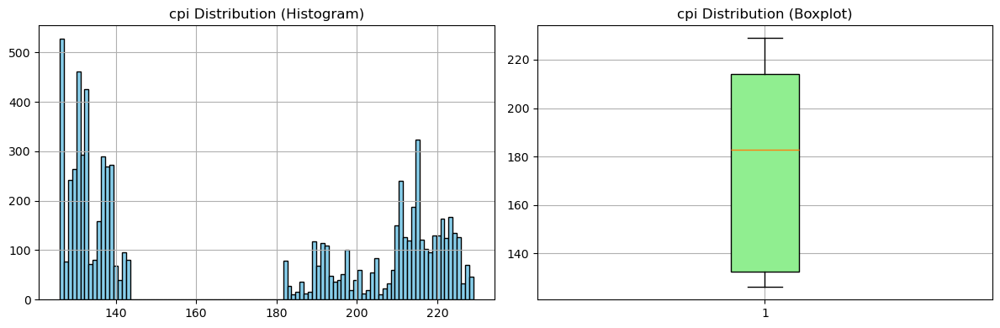

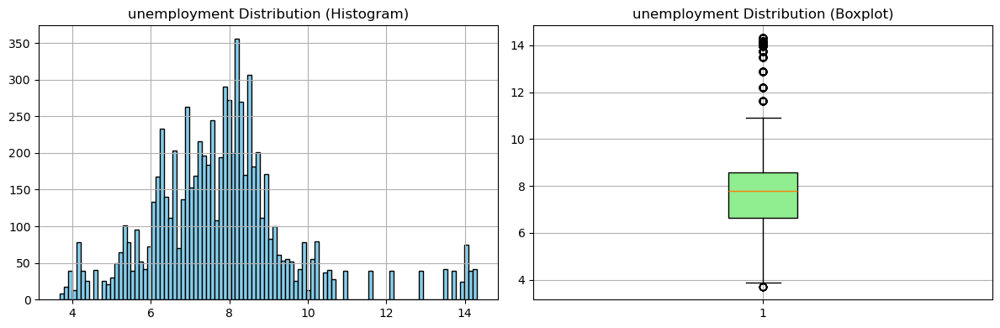

In [135]:
import matplotlib.pyplot as plt

columns = ['temperature','fuel_price','cpi','unemployment']

for col in columns:
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))  # 1 row, 2 columns
    
    # Histogram
    axes[0].hist(dataset_features[col].dropna(), bins=100, color='skyblue', edgecolor='black')
    axes[0].set_title(f"{col} Distribution (Histogram)")
    axes[0].grid(True)
    
    # Boxplot
    axes[1].boxplot(dataset_features[col].dropna(), vert=True, patch_artist=True,
                    boxprops=dict(facecolor='lightgreen'))
    axes[1].set_title(f"{col} Distribution (Boxplot)")
    axes[1].grid(True)
    
    plt.tight_layout()
    plt.show()


In [136]:
dataset_features.head()

,store,date,temperature,fuel_price,markdown1,markdown2,markdown3,markdown4,markdown5,total_markdown,cpi,unemployment,isholiday
0,1,2010-02-05,42.31,2.572,0.0,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False
1,1,2010-02-12,38.51,2.548,0.0,0.0,0.0,0.0,0.0,0.0,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,0.0,0.0,0.0,0.0,0.0,0.0,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,0.0,0.0,0.0,0.0,0.0,0.0,211.319643,8.106,False
4,1,2010-03-05,46.50,2.625,0.0,0.0,0.0,0.0,0.0,0.0,211.350143,8.106,False


In [137]:
dataset_features.isna().sum()

store               0
date                0
temperature         0
fuel_price          0
markdown1           0
markdown2           0
markdown3           0
markdown4           0
markdown5           0
total_markdown      0
cpi               585
unemployment      585
isholiday           0
dtype: int64

##### Lets visualize the Temperature cycles for each store

In [138]:
temperature_df=dataset_features.copy()[['store','date','temperature','isholiday']]
temperature_df.head()

,store,date,temperature,isholiday
0,1,2010-02-05,42.31,False
1,1,2010-02-12,38.51,True
2,1,2010-02-19,39.93,False
3,1,2010-02-26,46.63,False
4,1,2010-03-05,46.50,False


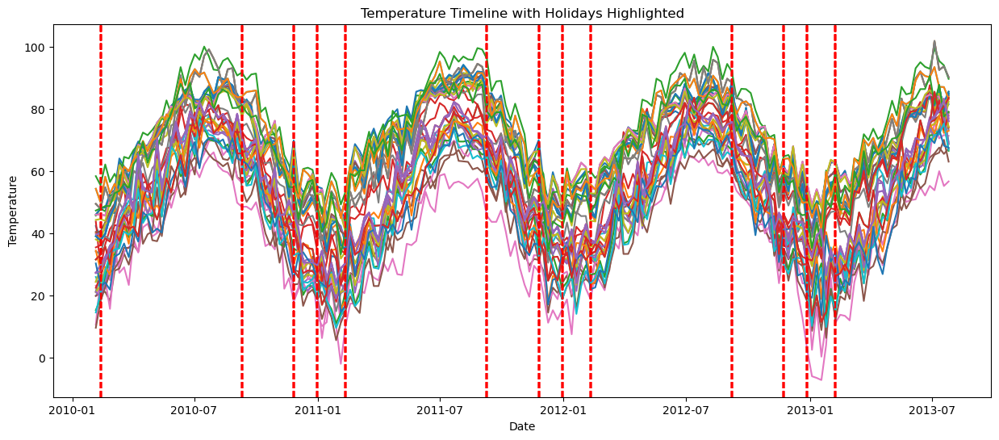

In [139]:
import matplotlib.pyplot as plt
import pandas as pd

# Ensure Date column is datetime and data is sorted
temperature_df['date'] = pd.to_datetime(temperature_df['date'])
temperature_df = temperature_df.sort_values(by=['store', 'date']).reset_index(drop=True)

stores = temperature_df['store'].unique()

plt.figure(figsize=(15, 6))

for store_id in stores:
    store_data = temperature_df[temperature_df['store'] == store_id]
    
    # Plot temperature line
    plt.plot(store_data['date'], store_data['temperature'], label=f'Store {store_id}')
    
    # Add vertical dashed lines for holidays
    holiday_dates = store_data.loc[store_data['isholiday'] == True, 'date']
    for date in holiday_dates:
        plt.axvline(x=date, color='red', linestyle='--', alpha=0.5)

plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature Timeline with Holidays Highlighted')
plt.show()

#### Observation(Obvious): Temperature has cyclic trends for all the stores

#### Now lets visualize the fuel prices for each store in respect to date as a timeline

In [140]:
fuel_df=dataset_features.copy()[['store','date','fuel_price','isholiday']]
fuel_df.head()

,store,date,fuel_price,isholiday
0,1,2010-02-05,2.572,False
1,1,2010-02-12,2.548,True
2,1,2010-02-19,2.514,False
3,1,2010-02-26,2.561,False
4,1,2010-03-05,2.625,False


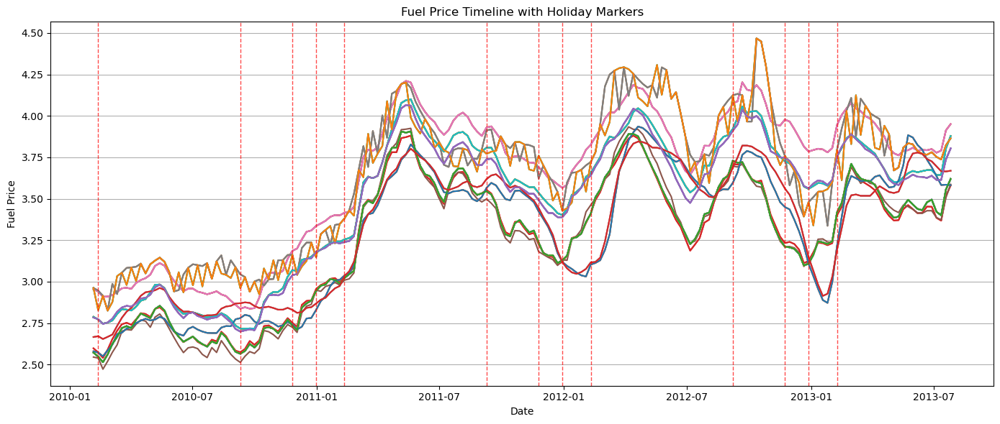

In [141]:
import matplotlib.pyplot as plt

fuel_df = fuel_df.sort_values(by=['store','date']).reset_index(drop=True)

plt.figure(figsize=(14,6))

# Plot fuel prices for each store
for store_id in fuel_df['store'].unique():
    store_data = fuel_df[fuel_df['store'] == store_id]
    plt.plot(store_data['date'], store_data['fuel_price'], label=f'Store {store_id}')

# Extract unique holiday dates
holiday_dates = fuel_df.loc[fuel_df['isholiday'] == True, 'date'].unique()

# Add vertical dashed lines for holidays
for holiday in holiday_dates:
    plt.axvline(x=holiday, color='red', linestyle='--', alpha=0.7, linewidth=1)

plt.title("Fuel Price Timeline with Holiday Markers")
plt.ylabel("Fuel Price")
plt.xlabel("Date")
plt.grid(axis='y')
plt.tight_layout()
plt.show()


#### Observation: Fuel Prices spike after the holidays each year before a decline in the fuel price after which the spike of the fuel prices is experienced after the last holiday date of the year

#### Visualizing the Markdown columns 1 to 5

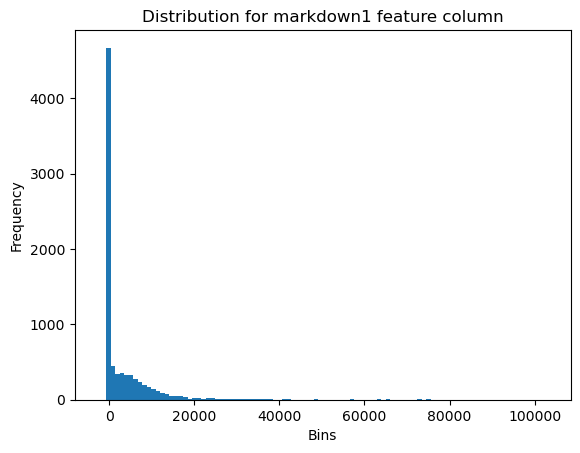

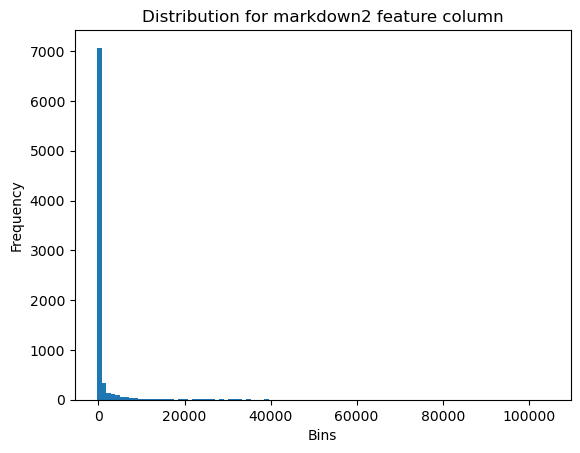

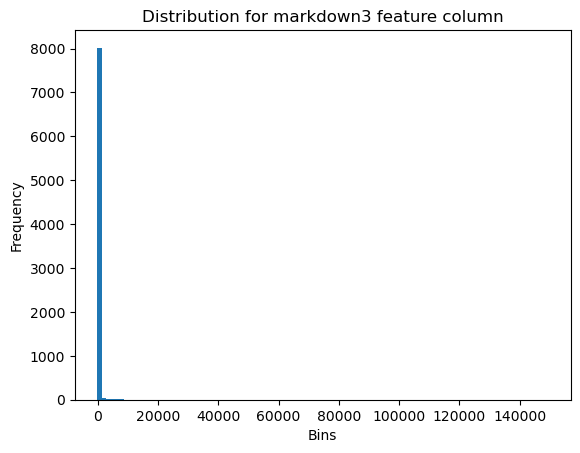

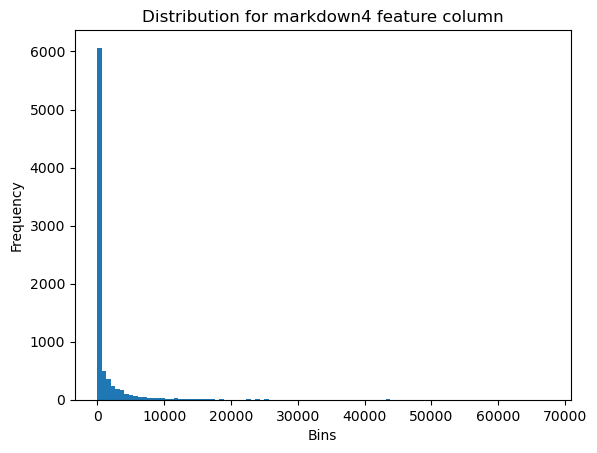

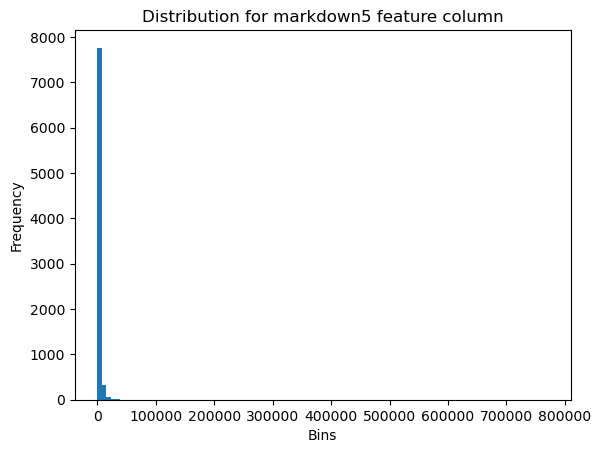

In [142]:
markdown_columns=['markdown1','markdown2','markdown3','markdown4','markdown5']

for col in markdown_columns:
    plt.hist(dataset_features[col],bins=100)
    plt.title(f"Distribution for {col} feature column")
    plt.xlabel("Bins")
    plt.ylabel("Frequency")
    plt.show()

In [143]:
dataset_features.head()

,store,date,temperature,fuel_price,markdown1,markdown2,markdown3,markdown4,markdown5,total_markdown,cpi,unemployment,isholiday
0,1,2010-02-05,42.31,2.572,0.0,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False
1,1,2010-02-12,38.51,2.548,0.0,0.0,0.0,0.0,0.0,0.0,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,0.0,0.0,0.0,0.0,0.0,0.0,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,0.0,0.0,0.0,0.0,0.0,0.0,211.319643,8.106,False
4,1,2010-03-05,46.50,2.625,0.0,0.0,0.0,0.0,0.0,0.0,211.350143,8.106,False


#### Visualizing each markdown feature column with respect to a timeline

      store       date  weekly_sales
0         1 2010-02-05     139884.94
1         1 2010-02-12     143081.42
2         1 2010-02-19     135066.75
3         1 2010-02-26     125048.08
4         1 2010-03-05     132945.44
5         1 2010-03-12     124418.65
6         1 2010-03-19     127434.37
7         1 2010-03-26     116688.75
8         1 2010-04-02     126907.41
9         1 2010-04-09     129466.97
10        1 2010-04-16     128626.08
11        1 2010-04-23     111703.46
12        1 2010-04-30     127811.89
13        1 2010-05-07     132217.62
14        1 2010-05-14     126004.12
15        1 2010-05-21     120036.99
16        1 2010-05-28     121902.19
17        1 2010-06-04     133056.97
18        1 2010-06-11     134711.49
19        1 2010-06-18     134118.05
20        1 2010-06-25     120172.47
21        1 2010-07-02     124821.44
22        1 2010-07-09     133820.17
23        1 2010-07-16     126469.77
24        1 2010-07-23     116256.35
25        1 2010-07-30     109943.02
2

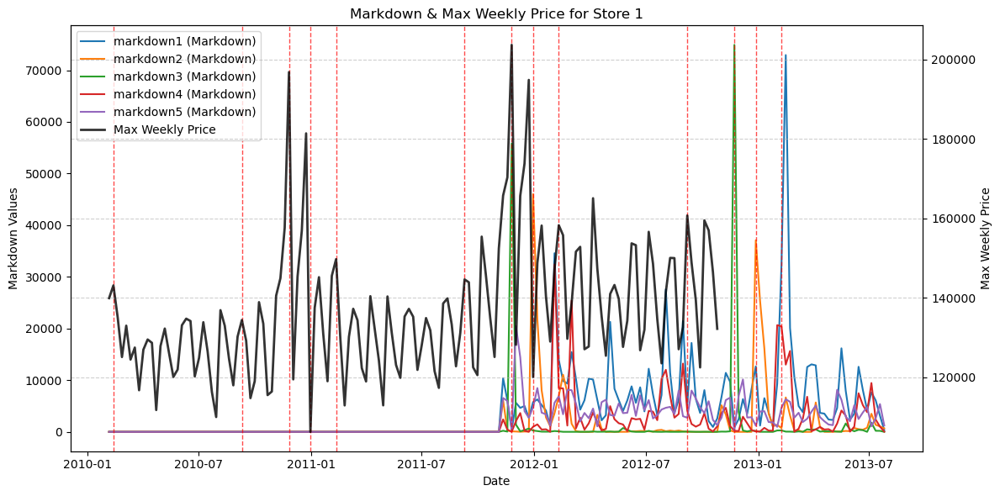

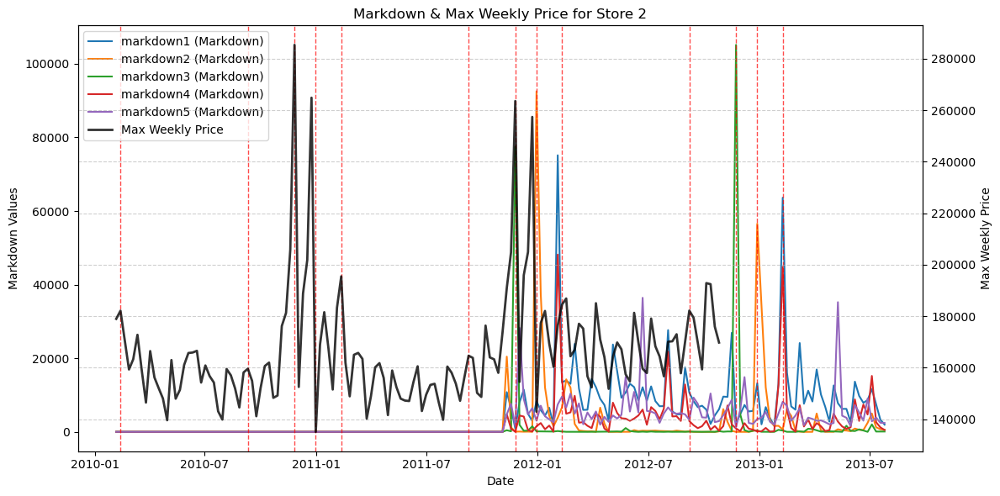

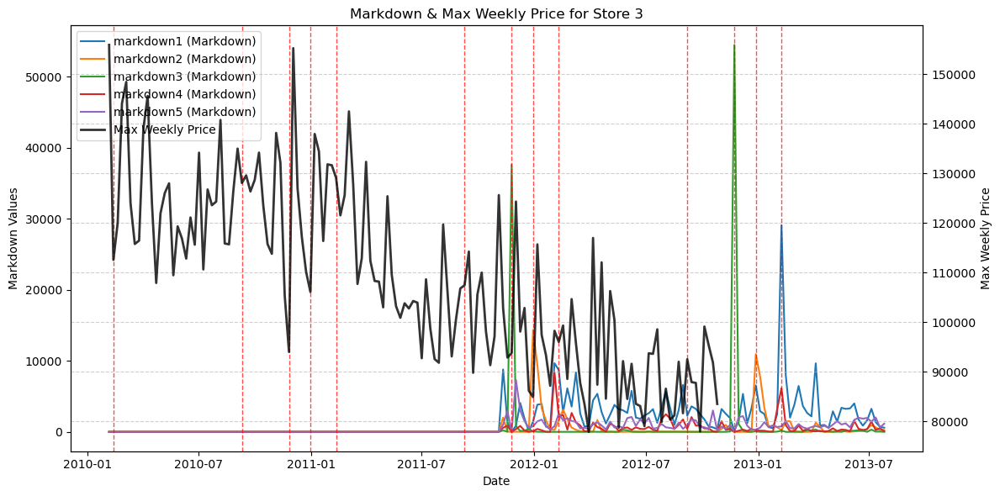

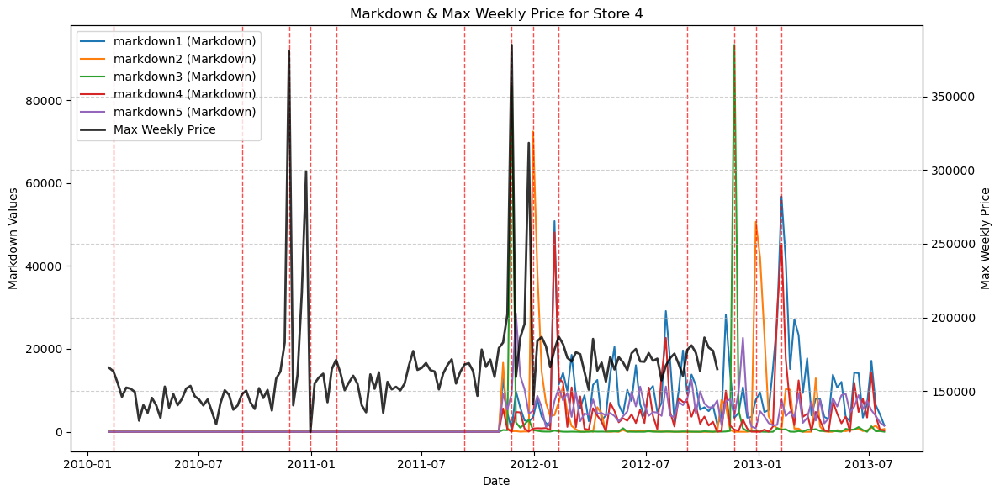

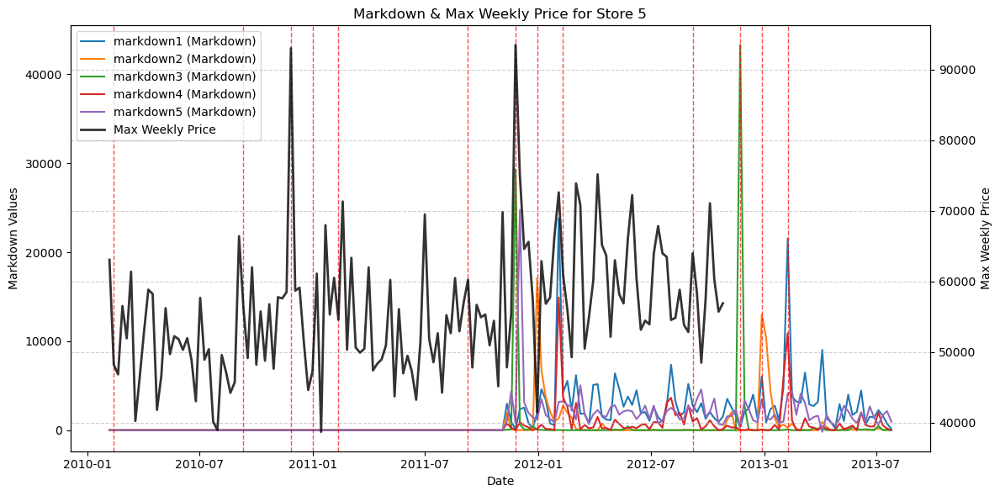

...

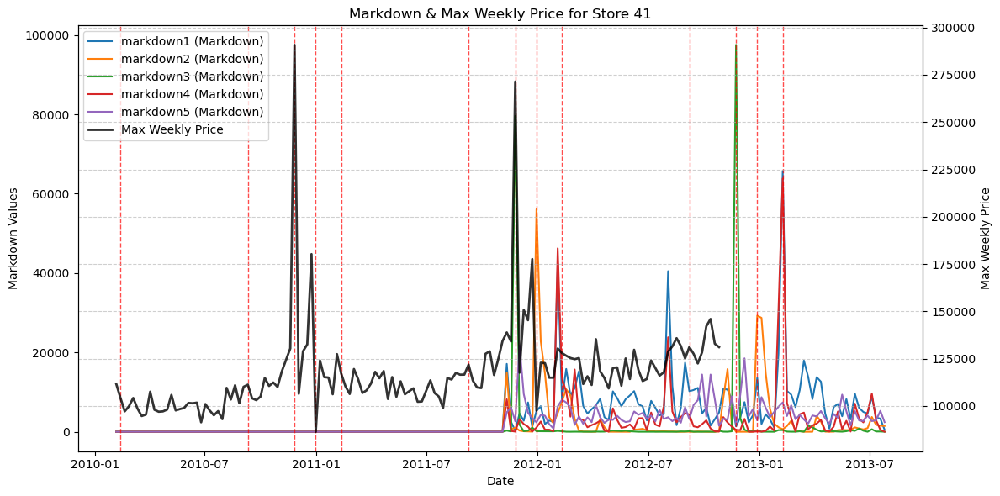

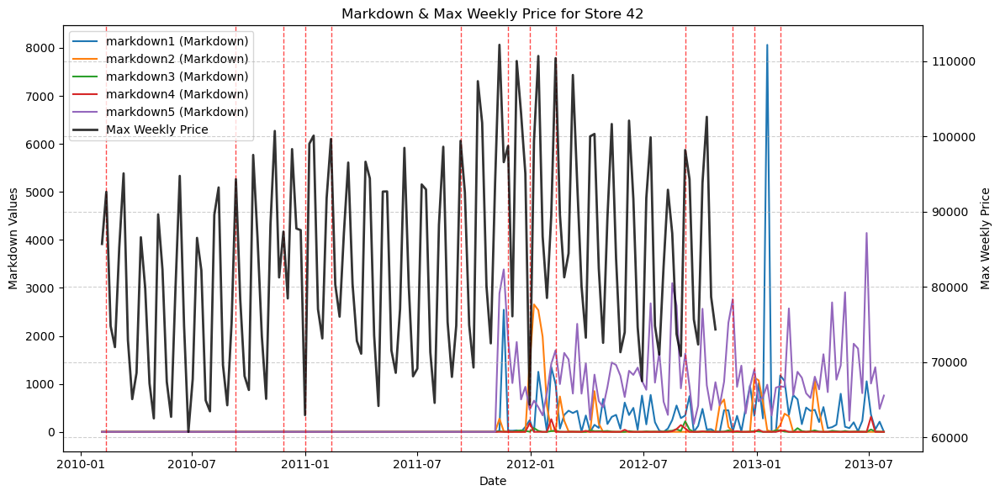

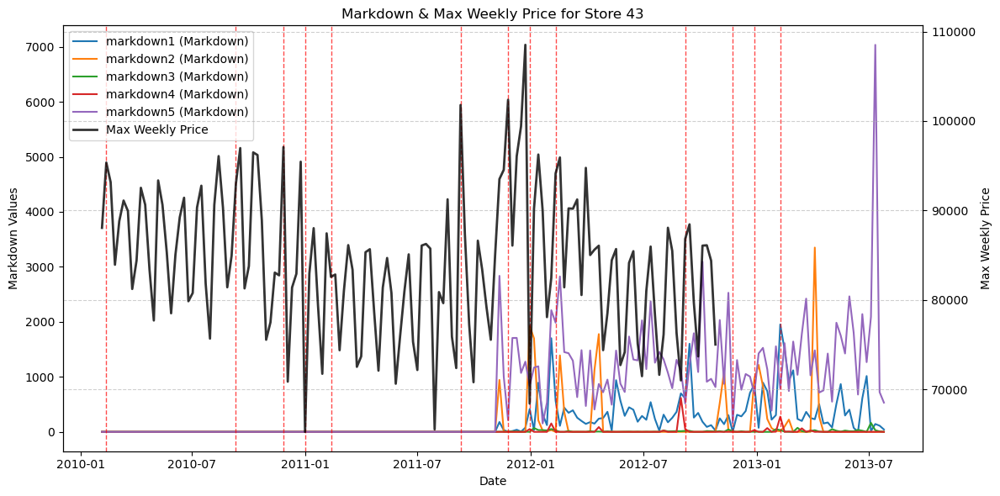

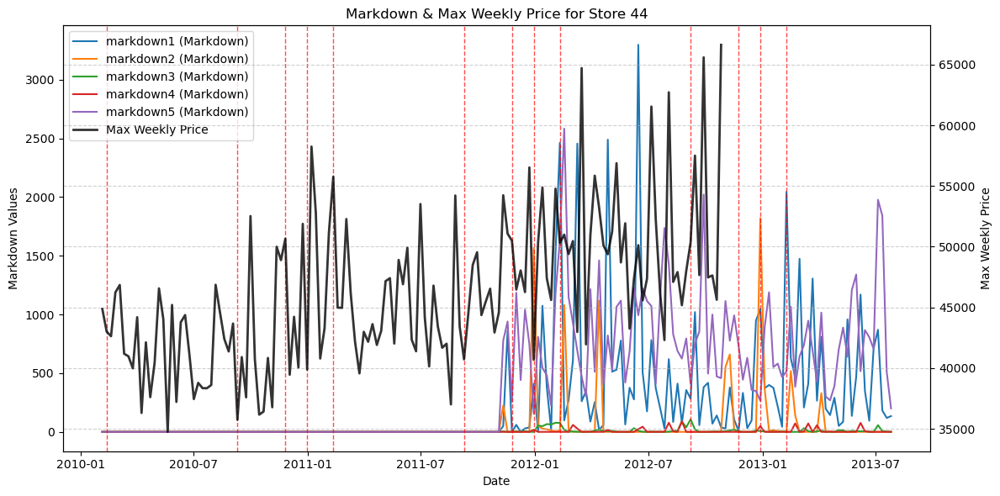

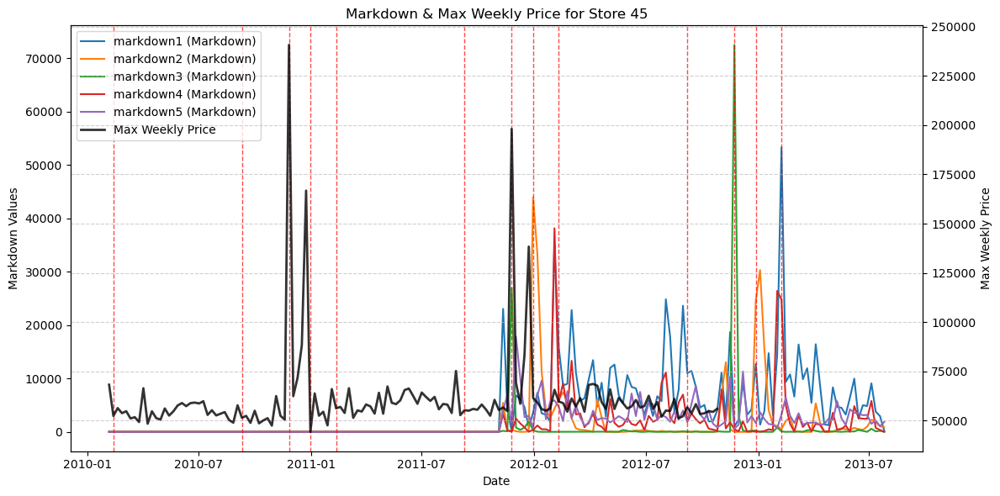

In [144]:
import matplotlib.pyplot as plt
import pandas as pd

weekly_price = dataset_train_full.groupby(['store', 'date'])['weekly_sales'].max().reset_index()
print(weekly_price)
weekly_price.rename(columns={'weekly_sales': 'max_weekly_sales'}, inplace=True)

dataset_features['date']=pd.to_datetime(dataset_features['date'])
dataset_features = dataset_features.merge(weekly_price, on=['store', 'date'], how='left')

print(dataset_features.isna().sum())

for store in sorted(dataset_features['store'].unique()):
    store_df = dataset_features[dataset_features['store'] == store]

    plt.figure(figsize=(12, 6))

    ax1 = plt.gca()
    for col in markdown_columns:
        ax1.plot(store_df['date'], store_df[col], label=f'{col} (Markdown)', linewidth=1.5)

    ax2 = ax1.twinx()
    ax2.plot(store_df['date'], store_df['max_weekly_sales'], color='black', label='Max Weekly Price', linewidth=2, alpha=0.8)
    ax2.set_ylabel("Max Weekly Price")

    holiday_dates = store_df.loc[store_df['isholiday'] == True, 'date'].unique()
    for hdate in holiday_dates:
        ax1.axvline(x=hdate, color='red', linestyle='--', alpha=0.7, linewidth=1)

    ax1.set_xlabel("Date")
    ax1.set_ylabel("Markdown Values")
    plt.title(f"Markdown & Max Weekly Price for Store {store}")

    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()


#### Creating a markdown_null feature column for the models to consider the markdown values or not

In [145]:
dataset_features['markdown_available'] = (
    dataset_features['total_markdown'] > 0
).astype(int)


In [146]:
dataset_features.head()

,store,date,temperature,fuel_price,markdown1,markdown2,markdown3,markdown4,markdown5,total_markdown,cpi,unemployment,isholiday,max_weekly_sales,markdown_available
0,1,2010-02-05,42.31,2.572,0.0,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,139884.94,0
1,1,2010-02-12,38.51,2.548,0.0,0.0,0.0,0.0,0.0,0.0,211.242170,8.106,True,143081.42,0
2,1,2010-02-19,39.93,2.514,0.0,0.0,0.0,0.0,0.0,0.0,211.289143,8.106,False,135066.75,0
3,1,2010-02-26,46.63,2.561,0.0,0.0,0.0,0.0,0.0,0.0,211.319643,8.106,False,125048.08,0
4,1,2010-03-05,46.50,2.625,0.0,0.0,0.0,0.0,0.0,0.0,211.350143,8.106,False,132945.44,0


#### Distribution of IsHoliday feature column

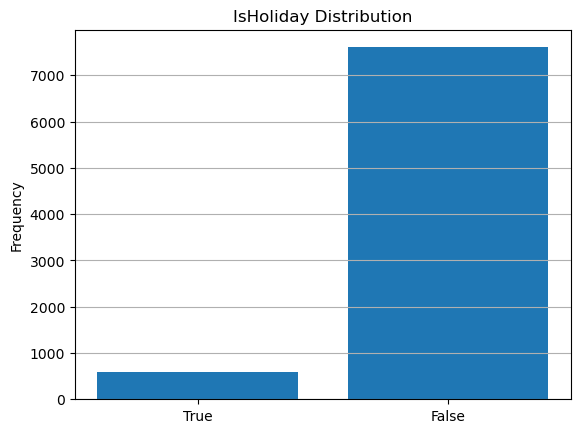

In [147]:
plt.bar(x=['True','False'],height=[dataset_features[dataset_features['isholiday']==True].shape[0],dataset_features[dataset_features['isholiday']==False].shape[0]])
plt.title("IsHoliday Distribution")
plt.ylabel("Frequency")
plt.grid(axis='y')
plt.show()

#### There is a sudden gap appearing the histogram of CPI feature column. Lets create a time line with Date to see if it is a data collection error

In [148]:
dataset_features['date']=pd.to_datetime(dataset_features['date'])
dataset_features=dataset_features.sort_values('date')

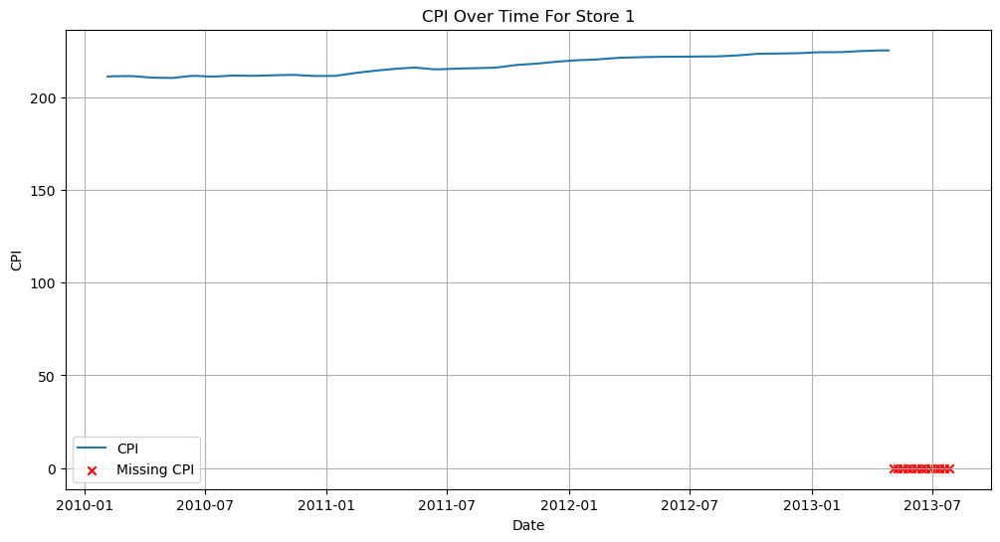

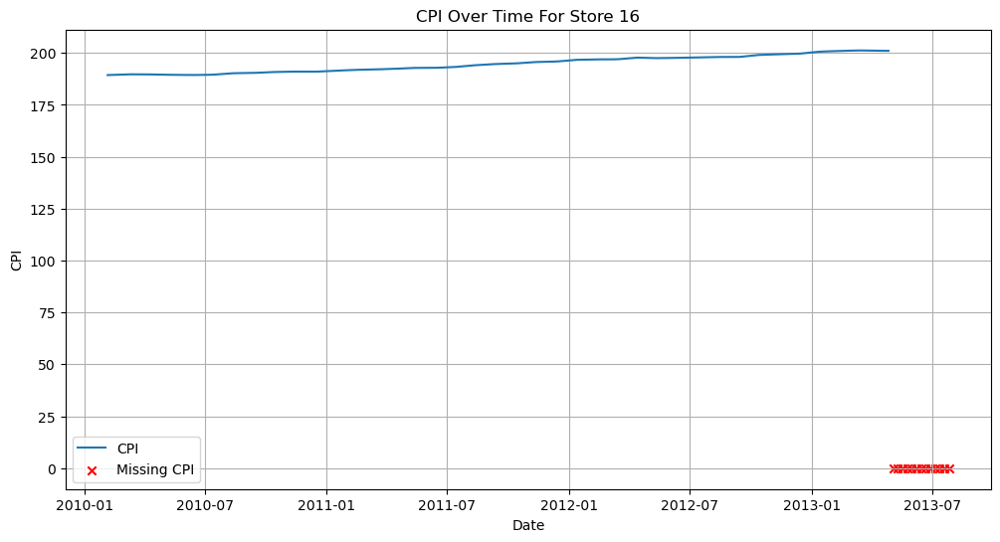

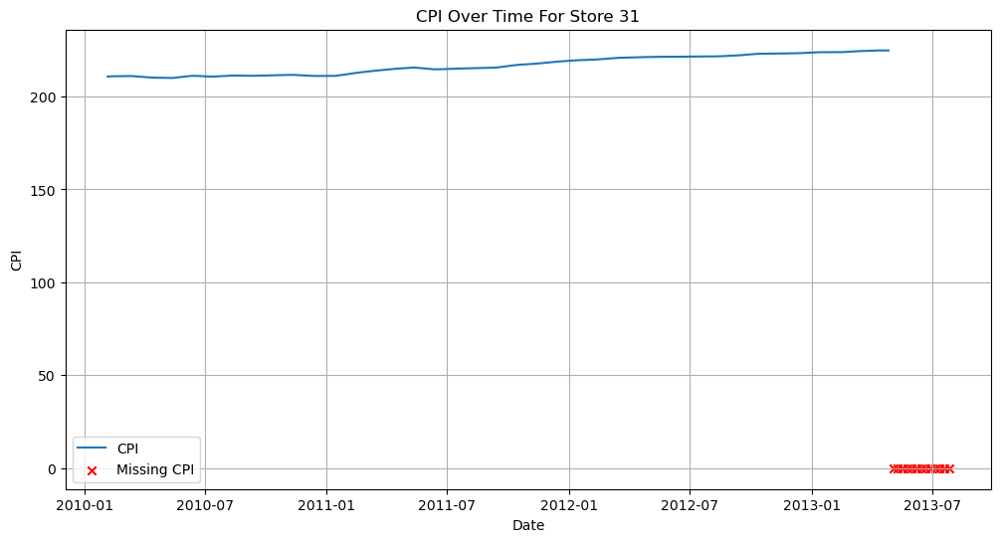

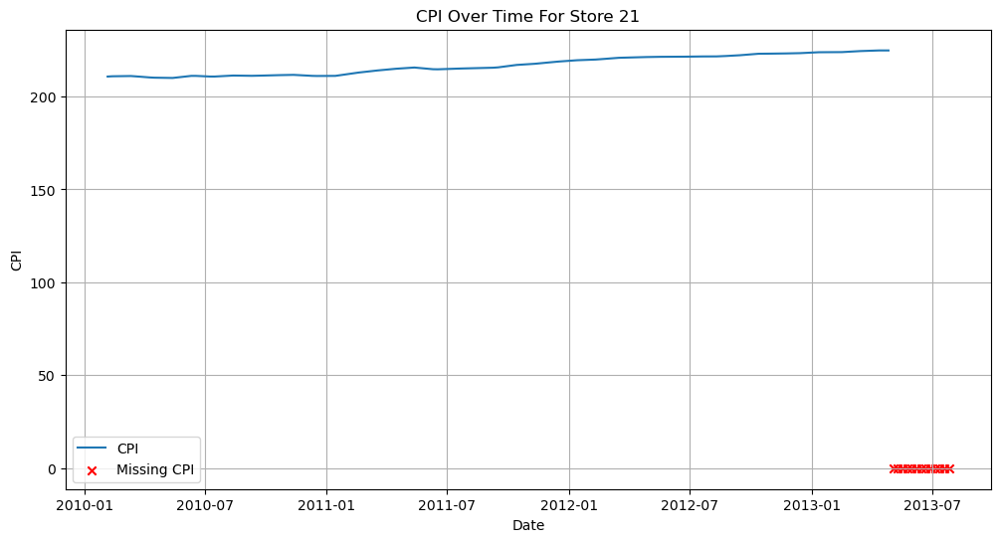

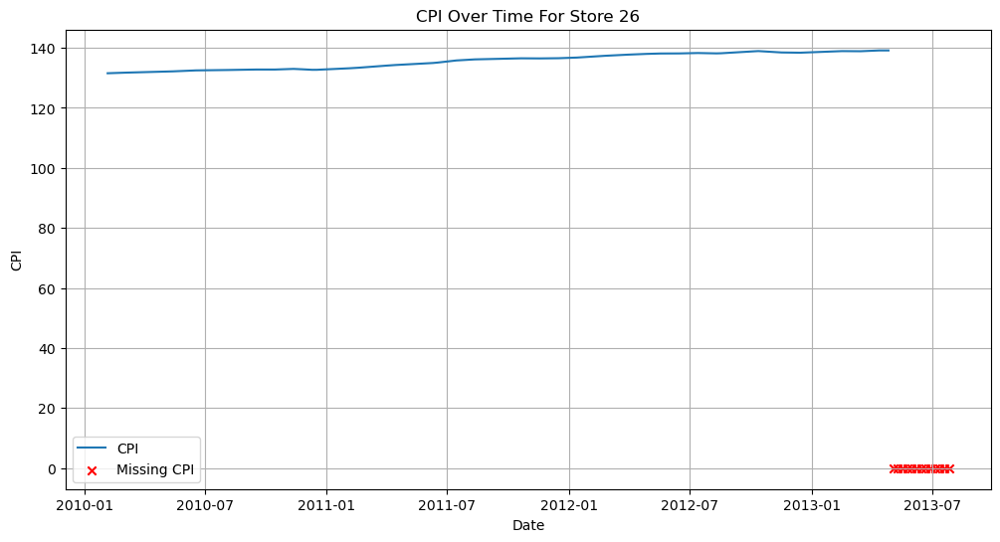

,store,missing_start_date,missing_end_date,missing_count
0,1,2013-05-03,2013-07-26,13
1,2,2013-05-03,2013-07-26,13
2,3,2013-05-03,2013-07-26,13
3,4,2013-05-03,2013-07-26,13
4,5,2013-05-03,2013-07-26,13
5,6,2013-05-03,2013-07-26,13
6,7,2013-05-03,2013-07-26,13
7,8,2013-05-03,2013-07-26,13
8,9,2013-05-03,2013-07-26,13
9,10,2013-05-03,2013-07-26,13


In [149]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure 'date' is datetime
dataset_features['date'] = pd.to_datetime(dataset_features['date'])

# List to store missing CPI info
missing_cpi_list = []

# Unique stores
store_unique_values = dataset_features['store'].unique()

for i, store_id in enumerate(store_unique_values):
    df_store = dataset_features[dataset_features['store'] == store_id]
    
    df_missing = df_store[df_store['cpi'].isna()]
    df_valid = df_store[df_store['cpi'].notna()]
    
    if not df_missing.empty:
        missing_cpi_list.append({
            'store': store_id,
            'missing_start_date': df_missing['date'].min(),
            'missing_end_date': df_missing['date'].max(),
            'missing_count': df_missing.shape[0]
        })
    
    # Plot for first 5 stores
    if i < 5:
        plt.figure(figsize=(12,6))
        plt.plot(df_valid['date'], df_valid['cpi'], label='CPI')
        plt.scatter(df_missing['date'], [0]*len(df_missing), color='red', label='Missing CPI', marker='x')
        plt.title(f'CPI Over Time For Store {store_id}')
        plt.xlabel('Date')
        plt.ylabel('CPI')
        plt.legend()
        plt.grid(True)
        plt.show()

# Convert missing CPI info to DataFrame
missing_cpi_df = pd.DataFrame(missing_cpi_list)
missing_cpi_df = (
    missing_cpi_df
    .sort_values(by=['store'])
    .reset_index(drop=True)
)
missing_cpi_df


In [150]:
13*45

585

#### This explains where the null values of the CPI feature column lies and how are those distributed.

#### We checked that there happens to be 3 categories of Type of Stores also in the histogram of Size feature column there happens to be 3 seperate distribution. Probably these 2 features can help in predicting the proper values of CPI as we observed that there are 3 startign points of CPI (between 120 to 140, 175 to 200 and between 200 and 220)

#### Lets create the dataset for training a suitable model to predict the values of CPI

In [151]:
from sqlalchemy import create_engine
import pandas as pd
import dotenv
import os

dotenv.load_dotenv()

user = os.getenv("DB_USERNAME")
password = os.getenv("DB_PASSWORD")
host = os.getenv("DB_HOST")
port = os.getenv("DB_PORT")
database = os.getenv("DB_NAME")

engine = create_engine(
    f"postgresql+psycopg2://{user}:{password}@{host}:{port}/{database}"
)

print(user, host, port, database)

postgres localhost 5432 store-sales


In [152]:
import psycopg2
import pandas as pd

conn = psycopg2.connect(
    host=os.getenv("DB_HOST"),
    database=os.getenv("DB_NAME"),
    user=os.getenv("DB_USERNAME"),
    password=os.getenv("DB_PASSWORD"),
    port=os.getenv("DB_PORT")
)

query="SELECT * FROM raw.stores;"
dataset_stores = pd.read_sql(query, conn)

dataset_stores.head()

,store,type,size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875


In [153]:
temp_df=dataset_features.copy()
temp_stores_df=dataset_stores.copy()
features_stores_merged_df=pd.merge(temp_df,temp_stores_df,how='left',on='store')
features_stores_merged_df=features_stores_merged_df.sort_values(by=['store','date']).reset_index(drop=True)
features_stores_merged_df.head()

,store,date,temperature,fuel_price,markdown1,markdown2,markdown3,markdown4,markdown5,total_markdown,cpi,unemployment,isholiday,max_weekly_sales,markdown_available,type,size
0,1,2010-02-05,42.31,2.572,0.0,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,139884.94,0,A,151315
1,1,2010-02-12,38.51,2.548,0.0,0.0,0.0,0.0,0.0,0.0,211.242170,8.106,True,143081.42,0,A,151315
2,1,2010-02-19,39.93,2.514,0.0,0.0,0.0,0.0,0.0,0.0,211.289143,8.106,False,135066.75,0,A,151315
3,1,2010-02-26,46.63,2.561,0.0,0.0,0.0,0.0,0.0,0.0,211.319643,8.106,False,125048.08,0,A,151315
4,1,2010-03-05,46.50,2.625,0.0,0.0,0.0,0.0,0.0,0.0,211.350143,8.106,False,132945.44,0,A,151315


In [154]:
features_stores_merged_df.isna().sum()

store                    0
date                     0
temperature              0
fuel_price               0
markdown1                0
markdown2                0
markdown3                0
markdown4                0
markdown5                0
total_markdown           0
cpi                    585
unemployment           585
isholiday                0
max_weekly_sales      1755
markdown_available       0
type                     0
size                     0
dtype: int64

#### Lets perform series differencing on CPI trends to convert it to a non stationary series

In [155]:
features_stores_merged_df['cpi_diff'] = features_stores_merged_df['cpi'].diff()

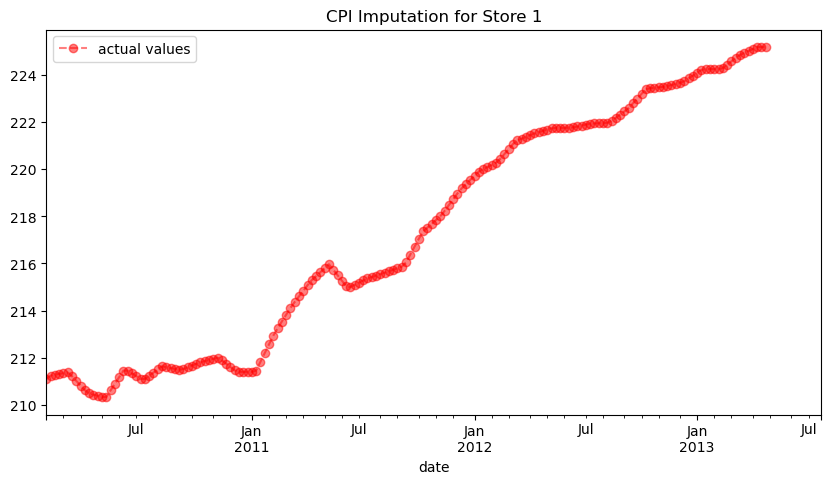

In [156]:
store_id = 1
subset = features_stores_merged_df[features_stores_merged_df['store'] == store_id].set_index('date')

plt.figure(figsize=(10,5))
subset['cpi'].plot(title=f'CPI Imputation for Store {store_id}',color='red',linestyle='--',marker='o',label='actual values',alpha=0.5)
plt.legend()
plt.show()

In [157]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_absolute_error
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.stats.diagnostic import acorr_ljungbox
import warnings

warnings.filterwarnings("ignore")

# ===============================
# Helper: AICc Calculation
# ===============================

def calculate_aicc(fit, n):
    """
    Compute Corrected AIC (AICc)
    """
    k = fit.df_model + 1  # approximate number of estimated parameters
    aic = fit.aic

    if n - k - 1 <= 0:
        return np.inf

    return aic + (2 * k * (k + 1)) / (n - k - 1)


# ===============================
# Parameters
# ===============================

store_ids = sorted(features_stores_merged_df['store'].unique())

# Stage A — Model Selection
TRAIN_SIZE_SELECTION = 156
VALIDATION_HORIZON = 13

# Stage B — Final Imputation
TRAIN_SIZE_FINAL = 169
FORECAST_HORIZON = 13

# ARIMA search space
candidate_orders = []
for p in [0, 1, 2]:
    for d in [0, 1]:
        for q in [0, 1, 2]:
            candidate_orders.append((p, d, q))

diagnostics_results = []

# ===============================
# Modeling Loop
# ===============================

for store_id in store_ids:

    subset = features_stores_merged_df[
        features_stores_merged_df['store'] == store_id
    ].copy()

    subset['date'] = pd.to_datetime(subset['date'])
    subset = subset.sort_values('date').set_index('date')

    series = subset['cpi']

    # Ensure enough data
    if series.dropna().shape[0] < TRAIN_SIZE_SELECTION + FORECAST_HORIZON:
        continue

    # =====================================================
    # STAGE A — MODEL SELECTION USING AICc (156 records)
    # =====================================================

    train_sel = series.iloc[:TRAIN_SIZE_SELECTION]
    test_sel = series.iloc[TRAIN_SIZE_SELECTION:
                           TRAIN_SIZE_SELECTION + VALIDATION_HORIZON]

    best_aicc = np.inf
    best_order = None

    for order in candidate_orders:
        try:
            model = ARIMA(train_sel, order=order)
            fit = model.fit()

            aicc = calculate_aicc(fit, len(train_sel))

            if aicc < best_aicc:
                best_aicc = aicc
                best_order = order

        except:
            continue

    if best_order is None:
        best_order = (1, 1, 0)

    # Baselines (evaluation only for stage A)
    naive_preds = np.repeat(train_sel.iloc[-1], VALIDATION_HORIZON)
    naive_mae = mean_absolute_error(test_sel, naive_preds)

    drift = (train_sel.iloc[-1] - train_sel.iloc[0]) / (len(train_sel) - 1)
    drift_preds = np.array([
        train_sel.iloc[-1] + (i + 1) * drift
        for i in range(VALIDATION_HORIZON)
    ])
    drift_mae = mean_absolute_error(test_sel, drift_preds)

    # Store Stage A diagnostics
    diagnostics_results.append({
        "store": store_id,
        "order": best_order,
        "selection_aicc": best_aicc,
        "naive_mae": naive_mae,
        "drift_mae": drift_mae
    })

    # =====================================================
    # STAGE B — FINAL MODEL FOR IMPUTATION
    # Train on first 169 records
    # Forecast last 13 records
    # =====================================================

    train_final = series.iloc[:TRAIN_SIZE_FINAL]

    final_model = ARIMA(train_final, order=best_order)
    final_fit = final_model.fit()

    final_forecast = final_fit.forecast(steps=FORECAST_HORIZON)

    # Ljung–Box test on residuals
    residuals = final_fit.resid.dropna()
    lb_test = acorr_ljungbox(residuals, lags=[10], return_df=True)

    # Only impute if residuals are white noise
    if lb_test["lb_pvalue"].iloc[0] > 0.05:

        missing_dates = series.iloc[TRAIN_SIZE_FINAL:].index

        features_stores_merged_df.loc[
            (features_stores_merged_df['store'] == store_id) &
            (features_stores_merged_df['date'].isin(missing_dates)),
            'cpi'
        ] = final_forecast.values


# ===============================
# Output Stage A Diagnostics
# ===============================

diagnostics_df = pd.DataFrame(diagnostics_results)
display(diagnostics_df)

,store,order,selection_aicc,naive_mae,drift_mae
0,1,"(2, 1, 0)",-388.177790,0.518020,0.078904
1,2,"(2, 1, 0)",-389.350018,0.517949,0.078542
2,3,"(2, 1, 0)",-377.030196,0.519553,0.085926
3,4,"(2, 1, 0)",-813.389016,0.379523,0.124352
4,5,"(2, 1, 0)",-386.284768,0.518277,0.079491
5,6,"(2, 1, 0)",-383.022003,0.518723,0.080544
6,7,"(2, 1, 2)",-542.767780,0.283783,0.234546
7,8,"(2, 1, 0)",-376.876795,0.519575,0.086072
8,9,"(2, 1, 0)",-376.271248,0.519660,0.086650
9,10,"(2, 1, 0)",-813.389016,0.379523,0.124352


In [158]:
print(diagnostics_df)

    store      order  selection_aicc  naive_mae  drift_mae
0       1  (2, 1, 0)     -388.177790   0.518020   0.078904
1       2  (2, 1, 0)     -389.350018   0.517949   0.078542
2       3  (2, 1, 0)     -377.030196   0.519553   0.085926
3       4  (2, 1, 0)     -813.389016   0.379523   0.124352
4       5  (2, 1, 0)     -386.284768   0.518277   0.079491
5       6  (2, 1, 0)     -383.022003   0.518723   0.080544
6       7  (2, 1, 2)     -542.767780   0.283783   0.234546
7       8  (2, 1, 0)     -376.876795   0.519575   0.086072
8       9  (2, 1, 0)     -376.271248   0.519660   0.086650
9      10  (2, 1, 0)     -813.389016   0.379523   0.124352
10     11  (2, 1, 0)     -377.030196   0.519553   0.085926
11     12  (2, 1, 0)     -813.389016   0.379523   0.124352
12     13  (2, 1, 0)     -813.389016   0.379523   0.124352
13     14  (2, 1, 0)     -511.416910   0.428032   0.067275
14     15  (2, 1, 0)     -706.959405   0.217641   0.119737
15     16  (2, 1, 2)     -542.767780   0.283783   0.2345

In [159]:
features_stores_merged_df.isna().sum()

store                    0
date                     0
temperature              0
fuel_price               0
markdown1                0
markdown2                0
markdown3                0
markdown4                0
markdown5                0
total_markdown           0
cpi                      0
unemployment           585
isholiday                0
max_weekly_sales      1755
markdown_available       0
type                     0
size                     0
cpi_diff               630
dtype: int64

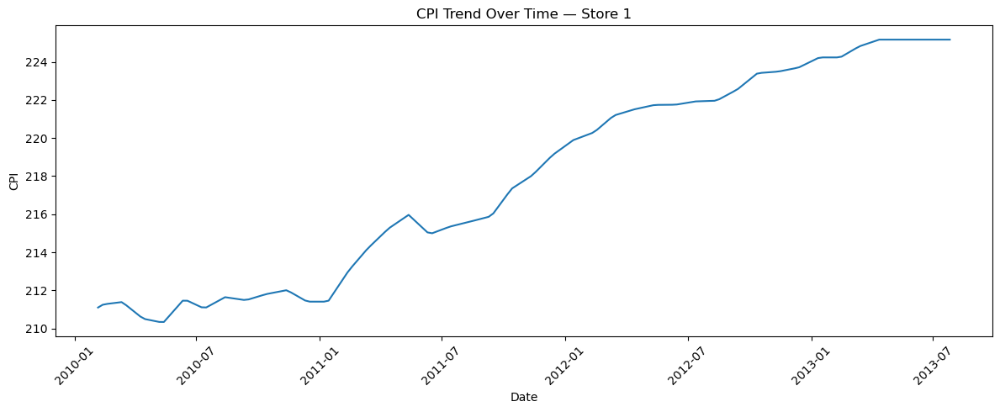

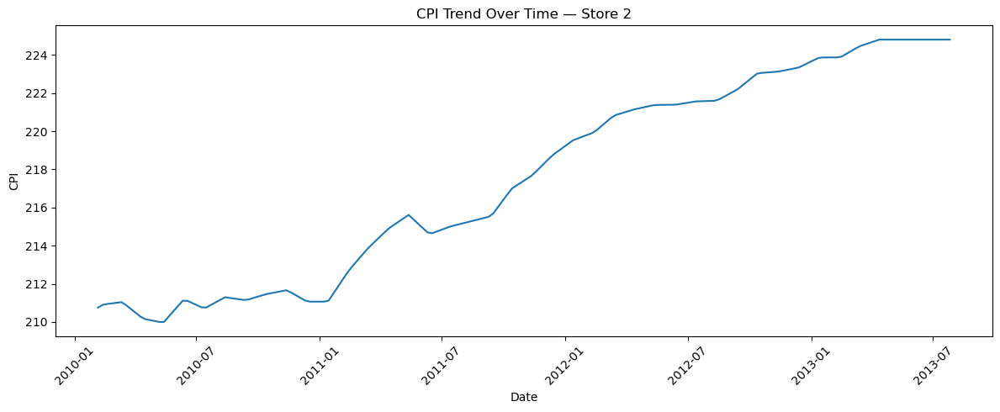

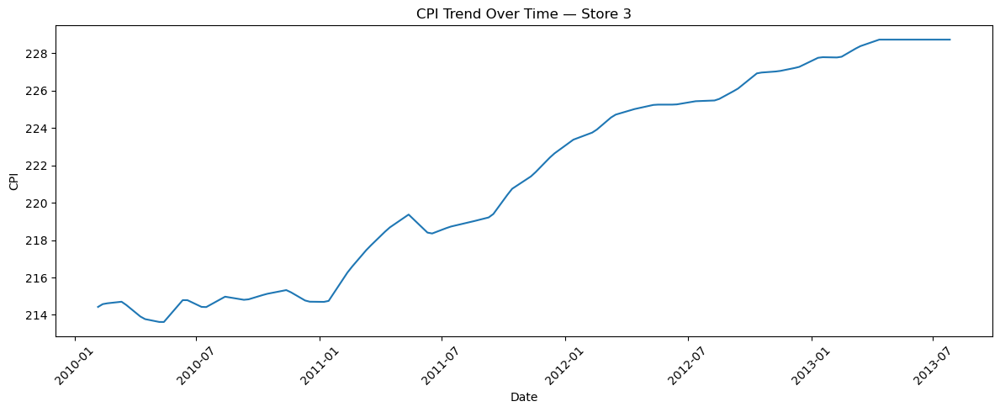

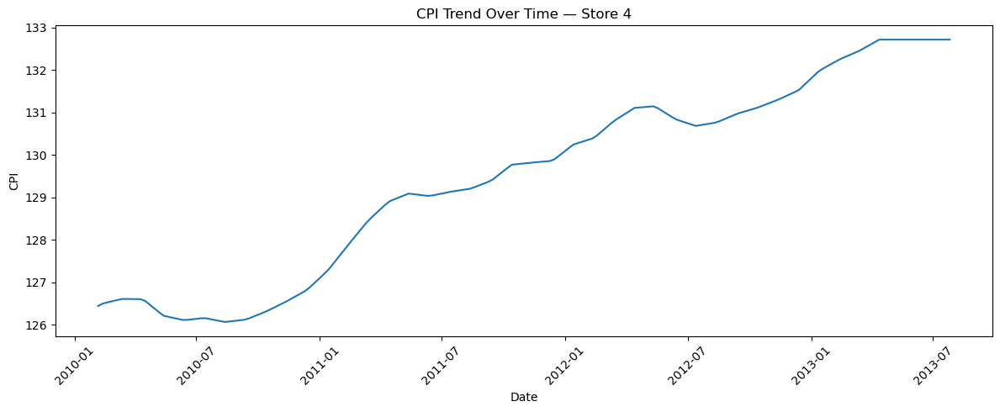

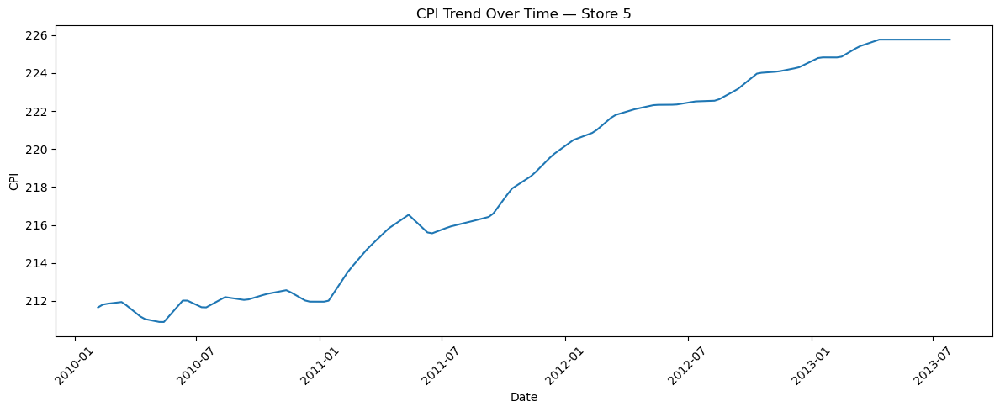

...

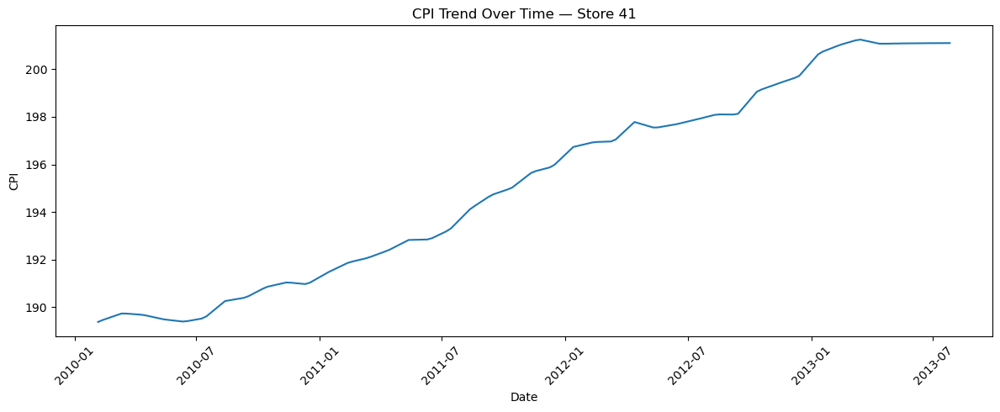

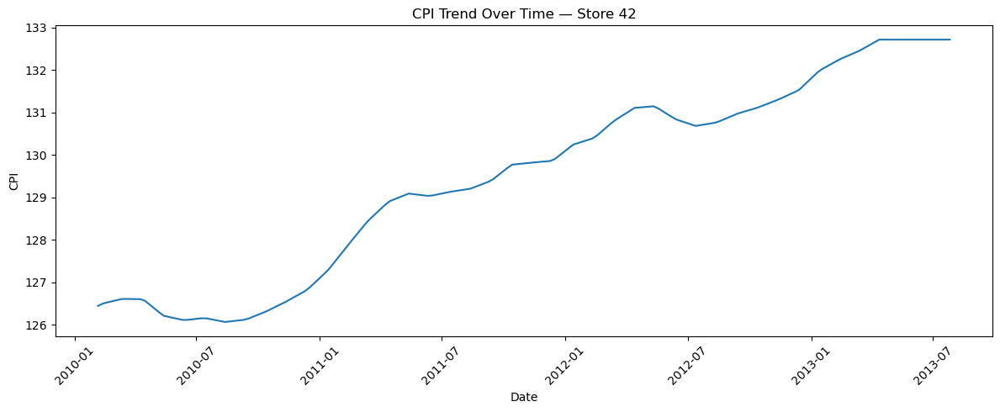

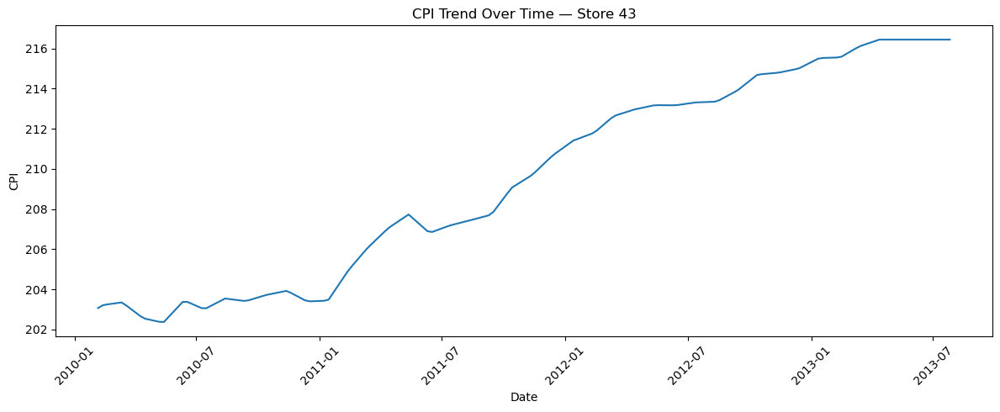

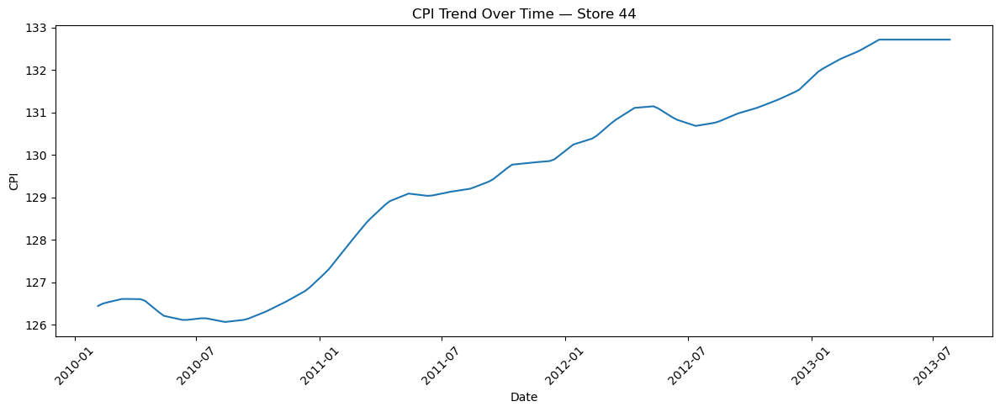

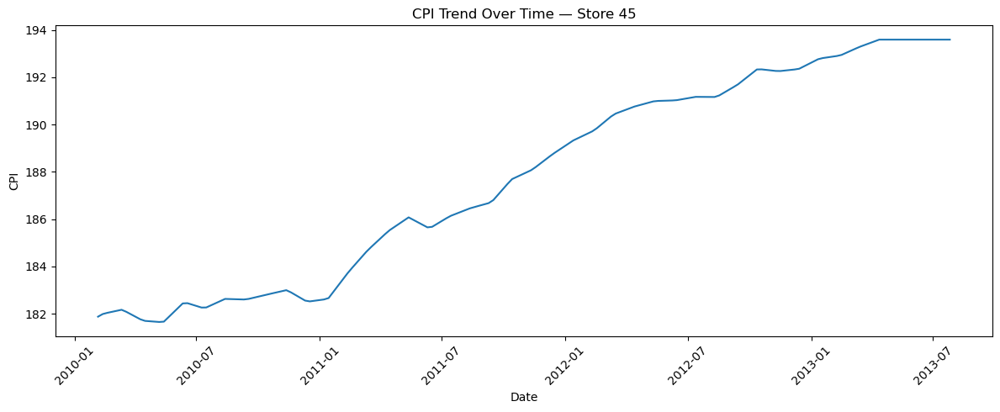

In [160]:
import matplotlib.pyplot as plt

# Ensure date is datetime
features_stores_merged_df['date'] = pd.to_datetime(features_stores_merged_df['date'])

# Sort values (already done but keeping for safety)
features_stores_merged_df = features_stores_merged_df.sort_values(by=['store', 'date'])

# Loop through each unique store
for store in features_stores_merged_df['store'].unique():
    
    subset = features_stores_merged_df[
        features_stores_merged_df['store'] == store
    ]
    
    # Create time-based plot
    plt.figure(figsize=(12, 5))
    plt.plot(subset['date'], subset['cpi'])
    
    plt.title(f'CPI Trend Over Time — Store {store}')
    plt.xlabel('Date')
    plt.ylabel('CPI')
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    plt.show()


#### Now lets deal with the case of having null values under the Unemployment feature column. First lets see the number of null values again 

In [161]:
features_stores_merged_df.isna().sum()

store                    0
date                     0
temperature              0
fuel_price               0
markdown1                0
markdown2                0
markdown3                0
markdown4                0
markdown5                0
total_markdown           0
cpi                      0
unemployment           585
isholiday                0
max_weekly_sales      1755
markdown_available       0
type                     0
size                     0
cpi_diff               630
dtype: int64

#### Wow again just like CPI the Unemployment feature columns is null exactly on those records where CPI happens to be null. Lets check the distribution of the Unemployment feature column

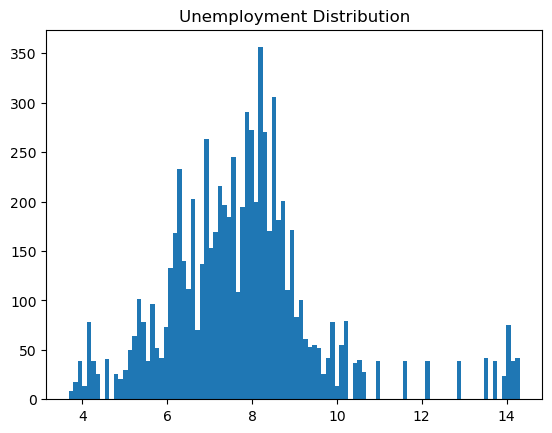

In [162]:
plt.hist(dataset_features['unemployment'],bins=100)
plt.title("Unemployment Distribution")
plt.show()

#### Also lets check the time series plot of unemployment for all the stores

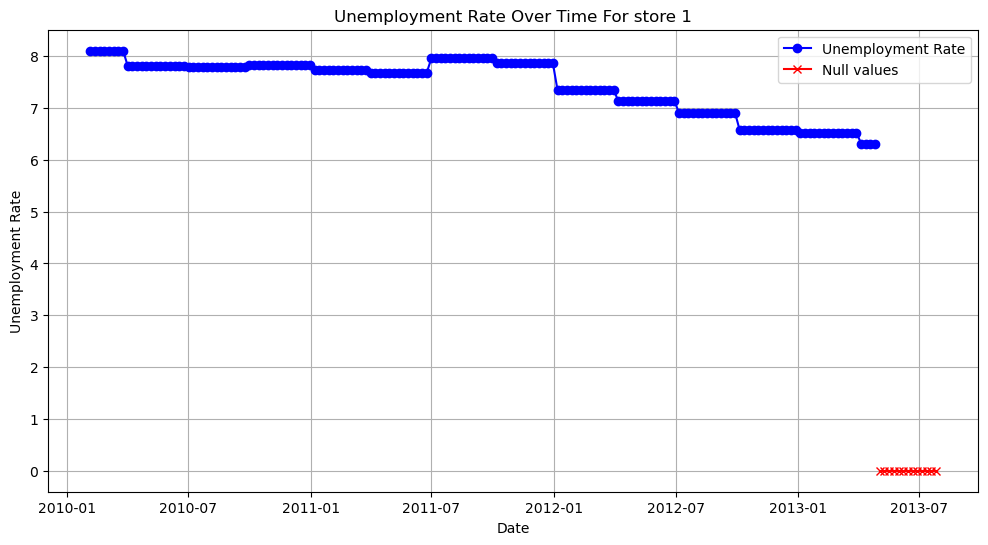

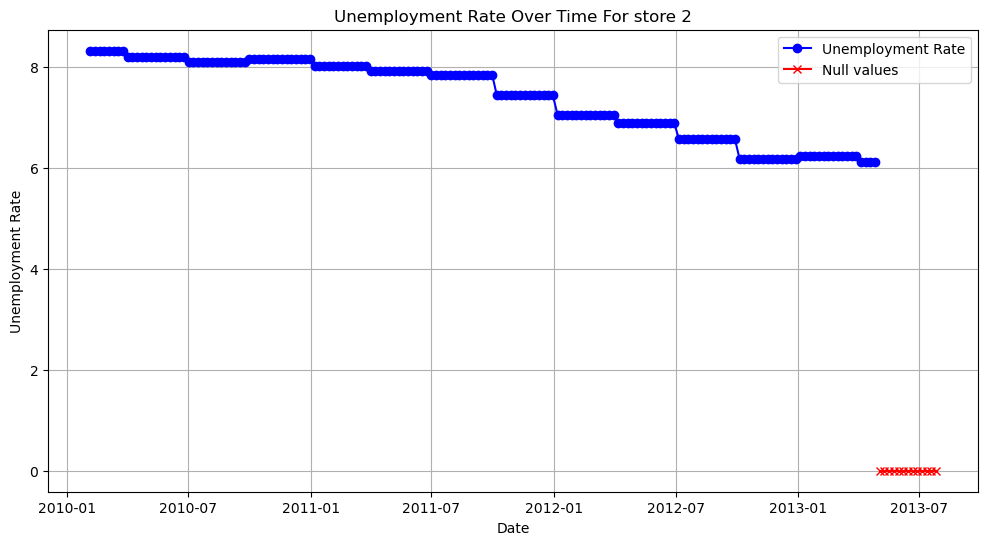

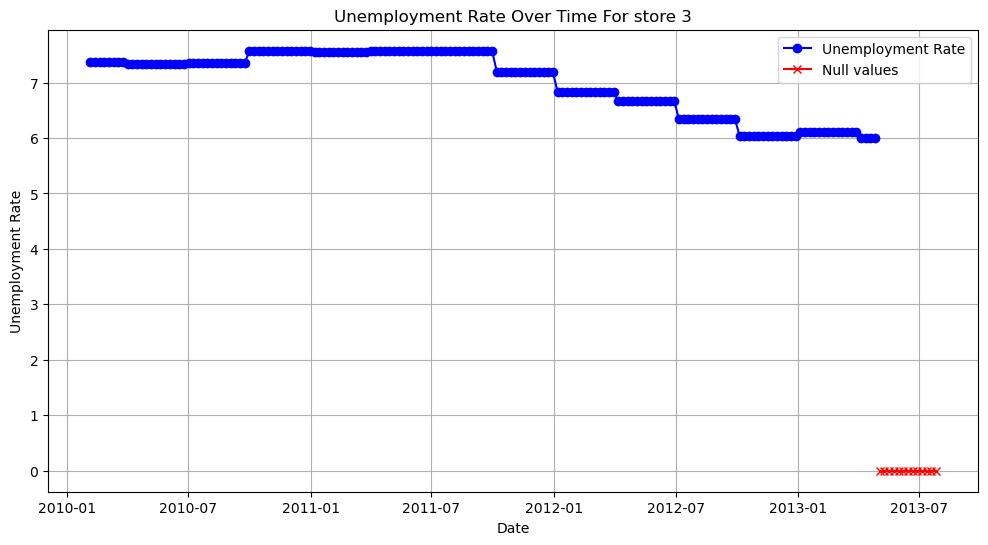

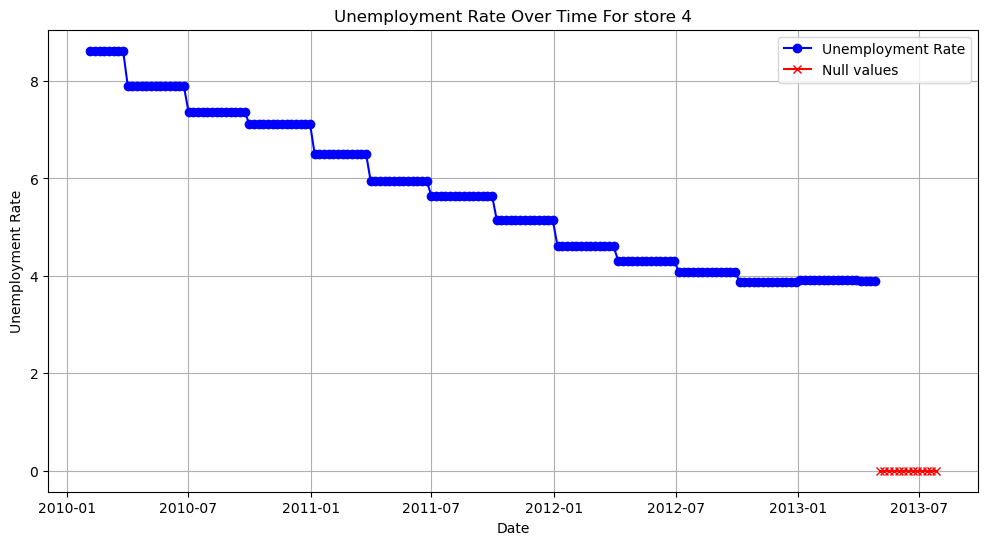

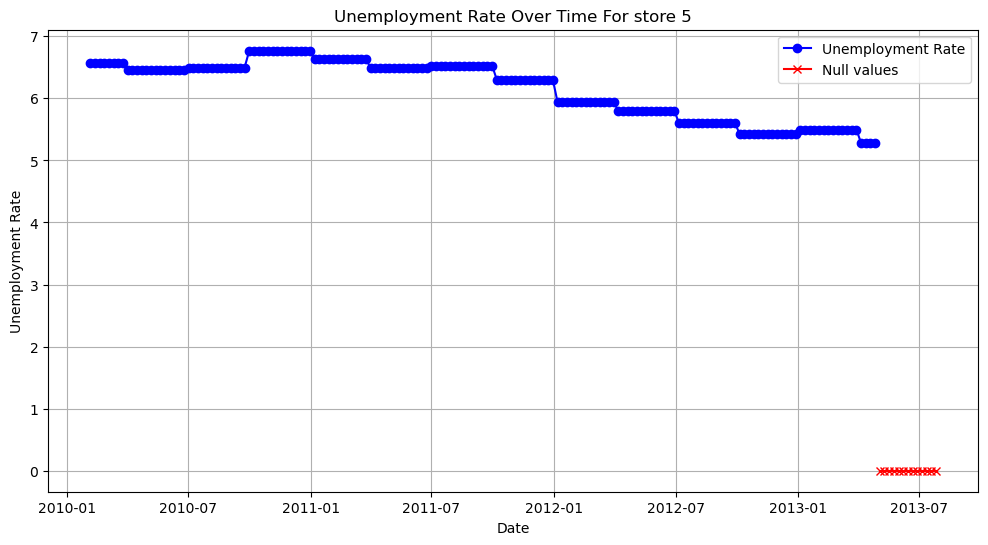

In [163]:
import matplotlib.pyplot as plt
import pandas as pd

store_ids=sorted(features_stores_merged_df['store'].unique()[:5])

for store_id in store_ids:
    unemployment_df_store_1=features_stores_merged_df[features_stores_merged_df['store']==store_id].sort_values('date')[['date','unemployment']].reset_index(drop=True)

    temp_df = unemployment_df_store_1.copy()
    temp_df['date'] = pd.to_datetime(temp_df['date'])
    temp_df = temp_df.sort_values('date').reset_index(drop=True)

    non_null_df = temp_df[temp_df['unemployment'].notna()]
    null_df=temp_df[temp_df['unemployment'].isna()]
    null_df['unemployment']=null_df['unemployment'].fillna(0)

    plt.figure(figsize=(12,6))
    plt.plot(
        non_null_df['date'],
        non_null_df['unemployment'],
        marker='o',
        linestyle='-',
        color='blue',
        label='Unemployment Rate'
    )
    plt.plot(
        null_df['date'],
        null_df['unemployment'],
        marker='x',
        linestyle='-',
        color='red',
        label='Null values'
    )

    plt.title(f'Unemployment Rate Over Time For store {store_id}')
    plt.xlabel('Date')
    plt.ylabel('Unemployment Rate')
    plt.grid(True,which='major')
    plt.legend()
    plt.show()


#### Looks like all the null values are ahead of all the data points

#### Lets confirm the time ranges in which the null values are occuring

In [164]:
features_stores_merged_df['date'] = pd.to_datetime(features_stores_merged_df['date'])
features_stores_merged_df = features_stores_merged_df.sort_values(['store', 'date'])

def get_null_ranges(group):
    group = group.copy()
    group['is_null'] = group['unemployment'].isna()

    # Identify start of each null segment
    group['null_start'] = group['is_null'] & (~group['is_null'].shift(1, fill_value=False))
    # Identify end of each null segment
    group['null_end'] = group['is_null'] & (~group['is_null'].shift(-1, fill_value=False))

    # Extract ranges
    starts = group.loc[group['null_start'], 'date'].tolist()
    ends = group.loc[group['null_end'], 'date'].tolist()
    return pd.DataFrame({
        'Null_Start': starts,
        'Null_End': ends
    })

# Apply to each store
null_ranges = features_stores_merged_df.groupby('store').apply(get_null_ranges).reset_index()

null_ranges

,store,level_1,Null_Start,Null_End
0,1,0,2013-05-03,2013-07-26
1,2,0,2013-05-03,2013-07-26
2,3,0,2013-05-03,2013-07-26
3,4,0,2013-05-03,2013-07-26
4,5,0,2013-05-03,2013-07-26
5,6,0,2013-05-03,2013-07-26
6,7,0,2013-05-03,2013-07-26
7,8,0,2013-05-03,2013-07-26
8,9,0,2013-05-03,2013-07-26
9,10,0,2013-05-03,2013-07-26


#### The unemployment feature columns values work in form of a step function going over a certain period so clearly we impute same values to all the null values provided that they are associated in a certain time frame but we will have to figure that out. In case that there are null values present in a different time frame we will have to figure out where all the null values lie and proceed accordingly

#### Lets try forward fill

In [165]:
import pandas as pd

features_stores_merged_df['date'] = pd.to_datetime(features_stores_merged_df['date'])
features_stores_merged_df = features_stores_merged_df.sort_values(['store', 'date']).reset_index(drop=True)

features_stores_merged_df['unemployment_ff'] = features_stores_merged_df.groupby('store')['unemployment'].fillna(method='ffill')

features_stores_merged_df['unemployment_ff'] = features_stores_merged_df.groupby('store')['unemployment_ff'].fillna(method='bfill')


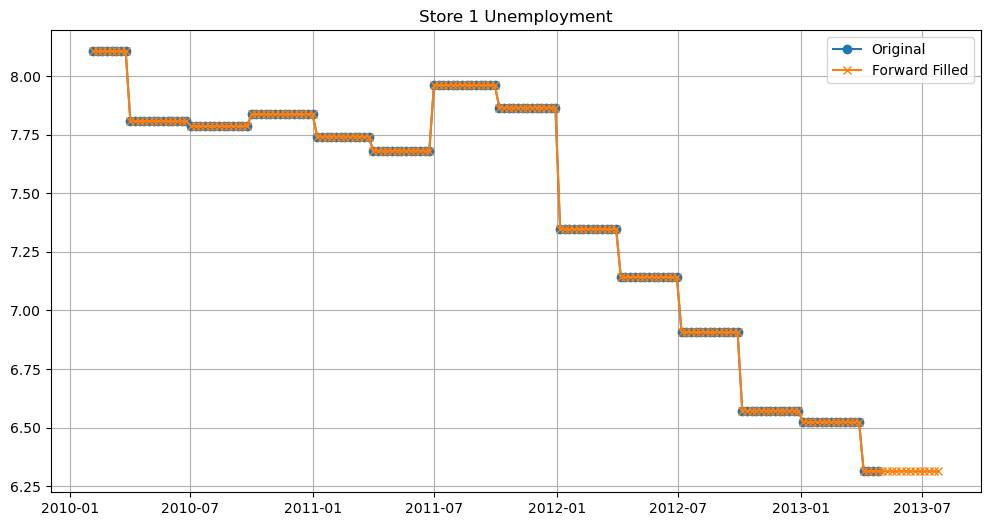

In [166]:
import matplotlib.pyplot as plt

# Plot example store
store = features_stores_merged_df['store'].unique()[0]
temp = features_stores_merged_df[features_stores_merged_df['store'] == store]

plt.figure(figsize=(12,6))
plt.plot(temp['date'], temp['unemployment'], marker='o', label='Original')
plt.plot(temp['date'], temp['unemployment_ff'], marker='x', label='Forward Filled')
plt.title(f'Store {store} Unemployment')
plt.grid(True)
plt.legend()
plt.show()


In [167]:
features_stores_merged_df.head()

,store,date,temperature,fuel_price,markdown1,markdown2,markdown3,markdown4,markdown5,total_markdown,cpi,unemployment,isholiday,max_weekly_sales,markdown_available,type,size,cpi_diff,unemployment_ff
0,1,2010-02-05,42.31,2.572,0.0,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,139884.94,0,A,151315,NaN,8.106
1,1,2010-02-12,38.51,2.548,0.0,0.0,0.0,0.0,0.0,0.0,211.242170,8.106,True,143081.42,0,A,151315,0.145812,8.106
2,1,2010-02-19,39.93,2.514,0.0,0.0,0.0,0.0,0.0,0.0,211.289143,8.106,False,135066.75,0,A,151315,0.046973,8.106
3,1,2010-02-26,46.63,2.561,0.0,0.0,0.0,0.0,0.0,0.0,211.319643,8.106,False,125048.08,0,A,151315,0.030500,8.106
4,1,2010-03-05,46.50,2.625,0.0,0.0,0.0,0.0,0.0,0.0,211.350143,8.106,False,132945.44,0,A,151315,0.030500,8.106


In [168]:
from statsmodels.tsa.ar_model import AutoReg
import pandas as pd

store_id = 1

features_stores_merged_df['date'] = pd.to_datetime(features_stores_merged_df['date'])
store_df = features_stores_merged_df[features_stores_merged_df['store'] == store_id].sort_values('date')
store_df = store_df.set_index('date')

quarterly_unemp = store_df['unemployment'].resample('QE').mean()
model = AutoReg(quarterly_unemp, lags=1).fit()

forecast = model.predict(start=len(quarterly_unemp), end=len(quarterly_unemp))
print(f"Forecasted unemployment for next quarter (Store {store_id}): {forecast.iloc[0]}")

Forecasted unemployment for next quarter (Store 1): nan


In [169]:
print(quarterly_unemp)
print(quarterly_unemp.isnull().sum())

date
2010-03-31    8.106
2010-06-30    7.808
2010-09-30    7.787
2010-12-31    7.838
2011-03-31    7.742
2011-06-30    7.682
2011-09-30    7.962
2011-12-31    7.866
2012-03-31    7.348
2012-06-30    7.143
2012-09-30    6.908
2012-12-31    6.573
2013-03-31    6.525
2013-06-30    6.314
2013-09-30      NaN
Freq: QE-DEC, Name: unemployment, dtype: float64
1


In [170]:
features_stores_merged_df[(features_stores_merged_df['unemployment'].isna())&(features_stores_merged_df['store']==1)].shape

(13, 19)

In [171]:
filter_df=features_stores_merged_df[((features_stores_merged_df['store']==1) & (features_stores_merged_df['date']<='2013-07-01')) & ((features_stores_merged_df['unemployment']<6.5) | (features_stores_merged_df['unemployment'].isna()))]
print(filter_df)
print(filter_df.shape)

     store       date  temperature  fuel_price  markdown1  markdown2  \
165      1 2013-04-05        58.59       3.583   12872.34    5687.86   
166      1 2013-04-12        62.72       3.529    3672.43     932.58   
167      1 2013-04-19        67.10       3.451    3530.36       3.95   
168      1 2013-04-26        59.23       3.417    2387.72       0.00   
169      1 2013-05-03        66.66       3.386    2298.63       2.00   
170      1 2013-05-10        63.90       3.392    4624.61      83.88   
171      1 2013-05-17        69.53       3.454   16170.50      92.00   
172      1 2013-05-24        77.19       3.494    7959.89     178.00   
173      1 2013-05-31        78.02       3.466    2369.77     142.45   
174      1 2013-06-07        76.44       3.439    3514.75     742.59   
175      1 2013-06-14        79.86       3.431   12592.32     527.48   
176      1 2013-06-21        81.35       3.479    8104.02     417.99   
177      1 2013-06-28        83.94       3.495    4205.98     79

In [172]:
import pandas as pd

features_stores_merged_df['date'] = pd.to_datetime(features_stores_merged_df['date'])
features_stores_merged_df=features_stores_merged_df.sort_values(by=['store','date']).reset_index(drop=True)

cutoff_date = pd.to_datetime('2013-07-01')

mask = features_stores_merged_df['date'] <= cutoff_date

features_stores_merged_df.loc[mask, 'unemployment'] = features_stores_merged_df.loc[mask, 'unemployment'].ffill()

In [173]:
features_stores_merged_df.isna().sum()

store                    0
date                     0
temperature              0
fuel_price               0
markdown1                0
markdown2                0
markdown3                0
markdown4                0
markdown5                0
total_markdown           0
cpi                      0
unemployment           180
isholiday                0
max_weekly_sales      1755
markdown_available       0
type                     0
size                     0
cpi_diff               630
unemployment_ff          0
dtype: int64

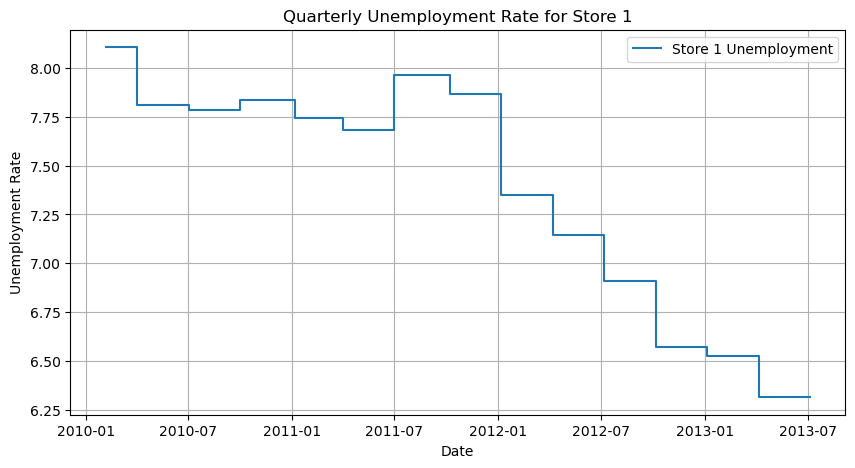

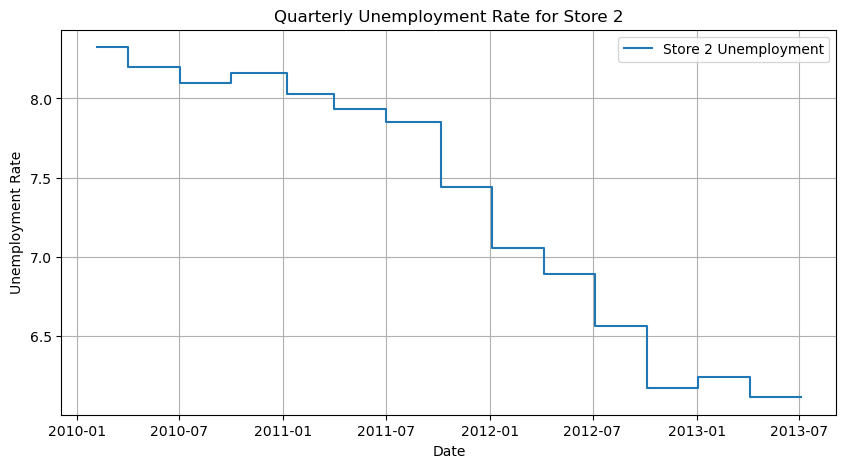

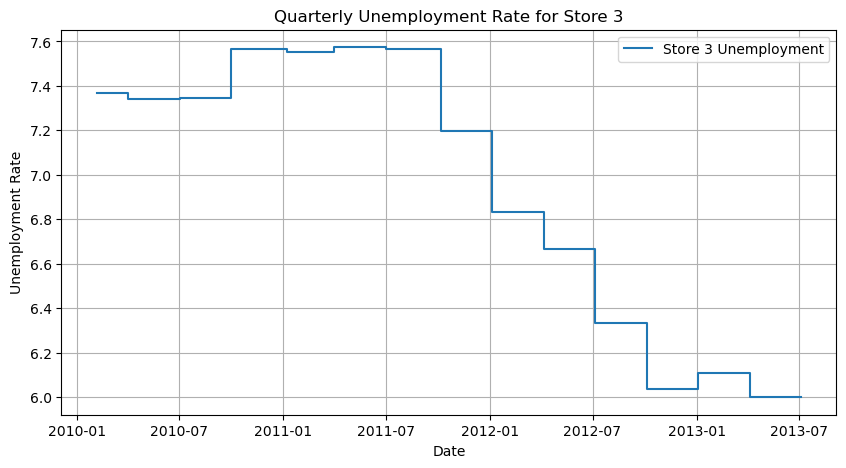

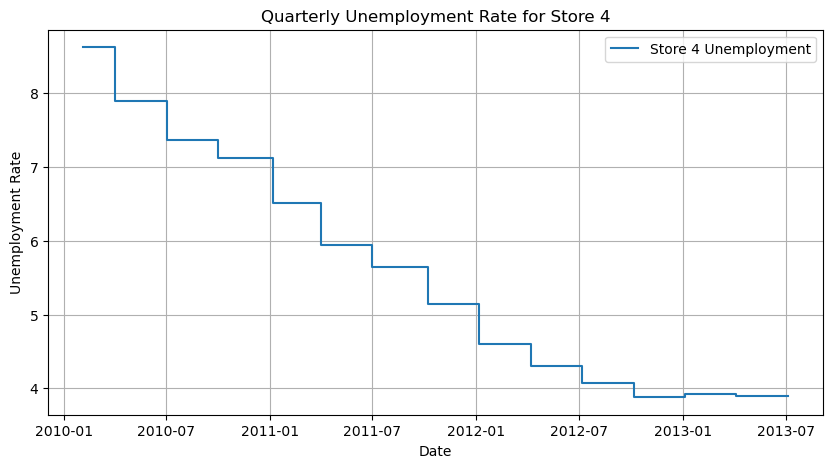

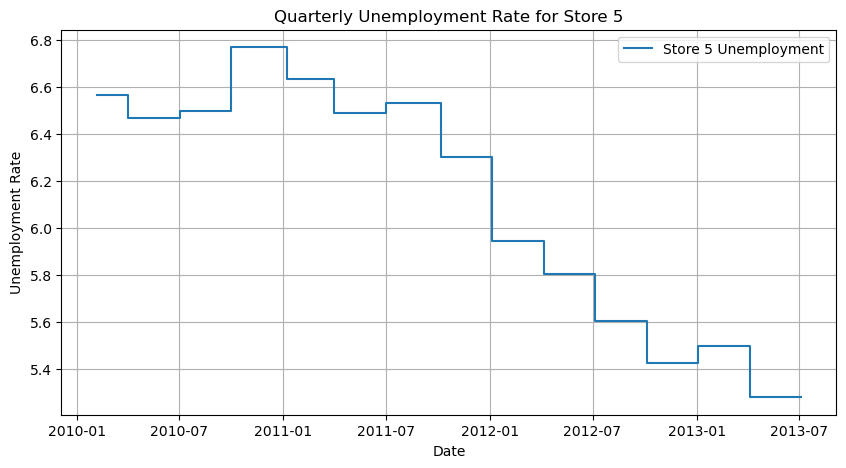

In [174]:
import matplotlib.pyplot as plt

features_stores_merged_df['date'] = pd.to_datetime(features_stores_merged_df['date'])

store_ids = features_stores_merged_df['store'].unique()[:5]
for id in store_ids:
    store_df = features_stores_merged_df[features_stores_merged_df['store'] == id].sort_values('date')
    plt.figure(figsize=(10,5))
    plt.step(store_df['date'], store_df['unemployment'], where='post', label=f'Store {id} Unemployment')
    plt.xlabel("Date")
    plt.ylabel("Unemployment Rate")
    plt.title(f"Quarterly Unemployment Rate for Store {id}")
    plt.grid(True)
    plt.legend()
    plt.show()

In [175]:
filter_df=features_stores_merged_df[((features_stores_merged_df['store']==1) & (features_stores_merged_df['date']>'2013-07-01')) & ((features_stores_merged_df['unemployment']<6.5) | (features_stores_merged_df['unemployment'].isna()))]
filter_df.shape

(4, 19)

In [176]:
4*45

180

#### This explains 2 things: 1) We now know why there are missing values in the CPI feature column (Maybe syncing issue in the data collection pipeline or CPI values not announced for the store probably happens after a certain period of time), and 2) Why there is a gap in the histogram of CPI (Some store CPI values start at around 120 and end to 130 or 140 and some stores CPI values start from around 180 and maybe goes to 190 or 220)

In [177]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA

features_stores_merged_df['date'] = pd.to_datetime(features_stores_merged_df['date'])
features_stores_merged_df = features_stores_merged_df.sort_values(['store', 'date']).reset_index(drop=True)

In [178]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_absolute_error
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
import warnings

warnings.filterwarnings("ignore")


def impute_unemployment_sarima(store_df,
                               target_col='unemployment'):

    df = store_df.copy()
    df['date'] = pd.to_datetime(df['date'])
    df = df.sort_values('date').set_index('date')

    series = df[target_col]

    TRAIN_SIZE = 156
    TEST_HORIZON = 13
    FINAL_TRAIN_SIZE = 169
    FORECAST_HORIZON = 13

    # Ensure enough data
    if series.dropna().shape[0] < TRAIN_SIZE + TEST_HORIZON:
        return df.reset_index()

    # =====================================================
    # STAGE A — MODEL SELECTION (156 → next 13)
    # =====================================================

    train = series.iloc[:TRAIN_SIZE]
    test = series.iloc[TRAIN_SIZE:TRAIN_SIZE + TEST_HORIZON]

    candidate_orders = []

    for p in [0, 1, 2]:
        for d in [0, 1]:
            for q in [0, 1, 2]:
                for P in [0, 1]:
                    for D in [0, 1]:
                        for Q in [0, 1]:
                            candidate_orders.append((p, d, q, P, D, Q))

    best_mae = np.inf
    best_order = None

    for order in candidate_orders:
        try:
            model = SARIMAX(
                train,
                order=order[:3],
                seasonal_order=(order[3], order[4], order[5], 12),
                enforce_stationarity=False,
                enforce_invertibility=False
            )

            fit = model.fit(disp=False)

            forecast = fit.forecast(steps=TEST_HORIZON)

            mae = mean_absolute_error(test, forecast)

            if mae < best_mae:
                best_mae = mae
                best_order = order

        except:
            continue

    if best_order is None:
        return df.reset_index()

    # =====================================================
    # STAGE B — FINAL TRAINING (169 → last 13)
    # =====================================================

    final_train = series.iloc[:FINAL_TRAIN_SIZE]

    final_model = SARIMAX(
        final_train,
        order=best_order[:3],
        seasonal_order=(best_order[3], best_order[4], best_order[5], 12),
        enforce_stationarity=False,
        enforce_invertibility=False
    )

    final_fit = final_model.fit(disp=False)

    final_forecast = final_fit.forecast(steps=FORECAST_HORIZON)

    # =====================================================
    # Ljung–Box Test
    # =====================================================

    residuals = final_fit.resid.dropna()
    lb_test = acorr_ljungbox(residuals, lags=[10], return_df=True)

    # =====================================================
    # Impute ONLY if residuals pass test
    # =====================================================

    if lb_test["lb_pvalue"].iloc[0] > 0.05:

        missing_dates = series.iloc[FINAL_TRAIN_SIZE:].index

        df.loc[missing_dates, target_col] = final_forecast.values

    return df.reset_index()

In [179]:
stores = features_stores_merged_df['store'].unique()
imputed_dfs = []

for store_id in stores:
    store_df = features_stores_merged_df[features_stores_merged_df['store'] == store_id]
    imputed_store_df = impute_unemployment_sarima(store_df)
    imputed_dfs.append(imputed_store_df)

df_imputed = pd.concat(imputed_dfs).sort_values(['store', 'date']).reset_index(drop=True)

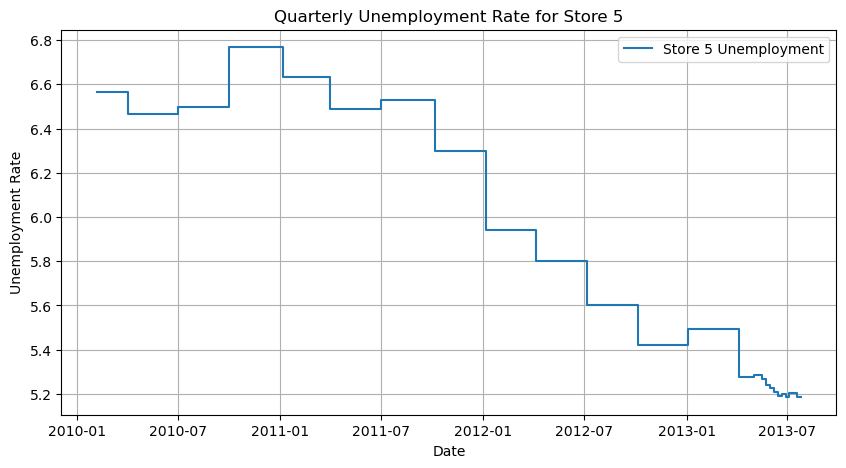

In [183]:
import matplotlib.pyplot as plt

df_imputed['date'] = pd.to_datetime(df_imputed['date'])

store_id = 5
store_df = df_imputed[df_imputed['store'] == store_id].sort_values('date')

plt.figure(figsize=(10,5))
plt.step(store_df['date'], store_df['unemployment'], where='post', label=f'Store {store_id} Unemployment')
plt.xlabel("Date")
plt.ylabel("Unemployment Rate")
plt.title(f"Quarterly Unemployment Rate for Store {store_id}")
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
import pandas as pd
import numpy as np

features_stores_merged_df['date'] = pd.to_datetime(features_stores_merged_df['date'])

features_stores_merged_df['quarter'] = features_stores_merged_df['date'].dt.to_period('Q')

In [ ]:
features_stores_merged_df.head()

,store,date,temperature,fuel_price,markdown1,markdown2,markdown3,markdown4,markdown5,total_markdown,cpi,unemployment,isholiday,max_weekly_sales,markdown_available,type,size,cpi_diff,unemployment_ff,quarter
0,1,2010-02-05,42.31,2.572,0.0,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False,139884.94,0,A,151315,NaN,8.106,2010Q1
1,1,2010-02-12,38.51,2.548,0.0,0.0,0.0,0.0,0.0,0.0,211.242170,8.106,True,143081.42,0,A,151315,0.145812,8.106,2010Q1
2,1,2010-02-19,39.93,2.514,0.0,0.0,0.0,0.0,0.0,0.0,211.289143,8.106,False,135066.75,0,A,151315,0.046973,8.106,2010Q1
3,1,2010-02-26,46.63,2.561,0.0,0.0,0.0,0.0,0.0,0.0,211.319643,8.106,False,125048.08,0,A,151315,0.030500,8.106,2010Q1
4,1,2010-03-05,46.50,2.625,0.0,0.0,0.0,0.0,0.0,0.0,211.350143,8.106,False,132945.44,0,A,151315,0.030500,8.106,2010Q1


In [ ]:
quarterly_mean = features_stores_merged_df.groupby(['store', 'quarter'])['unemployment'].mean().reset_index()

In [ ]:
quarterly_mean.head()

,store,quarter,unemployment
0,1,2010Q1,8.106
1,1,2010Q2,7.808
2,1,2010Q3,7.787
3,1,2010Q4,7.838
4,1,2011Q1,7.742


In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

def predict_all_quarters(store_quarter_df, degree=5):
    store_quarter_df = store_quarter_df.copy()
    store_quarter_df['quarter_num'] = np.arange(len(store_quarter_df))

    # Training data
    train_df = store_quarter_df.dropna(subset=['unemployment'])
    # print(train_df['Quarter_num'].values.reshape(-1,1))
    X = train_df['quarter_num'].values.reshape(-1,1)
    # print(train_df['Unemployment'].values)
    y = train_df['unemployment'].values
    # Polynomial fit
    poly = PolynomialFeatures(degree=degree)
    X_poly = poly.fit_transform(X)
    model = LinearRegression().fit(X_poly, y)

    # Predict for ALL quarters in dataset
    X_all = store_quarter_df['quarter_num'].values.reshape(-1,1)
    store_quarter_df['predicted'] = model.predict(poly.transform(X_all))

    return store_quarter_df[['quarter','predicted']]

In [ ]:
# --- Imputation ---
for store_id in features_stores_merged_df['store'].unique():
    # Quarterly-level regression predictions
    store_quarter_df = quarterly_mean[quarterly_mean['store']==store_id]
    pred_quarters = predict_all_quarters(store_quarter_df, degree=5)

    # Map back to features_stores_merged_df
    for _, row in pred_quarters.iterrows():
        mask = (
            (features_stores_merged_df['store']==store_id) &
            (features_stores_merged_df['quarter']==row['quarter']) &
            (features_stores_merged_df['unemployment'].isna())
        )
        features_stores_merged_df.loc[mask, 'unemployment_pred'] = row['predicted']


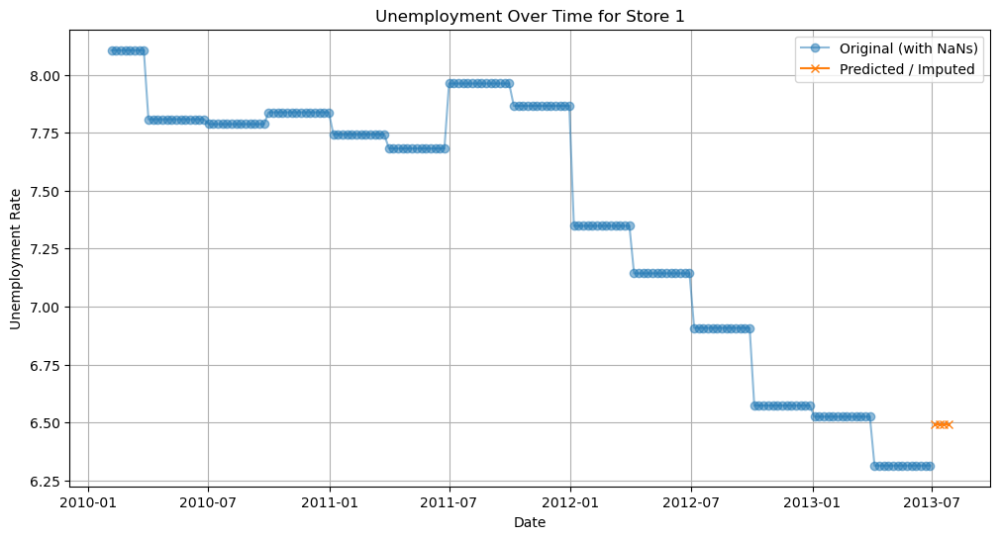

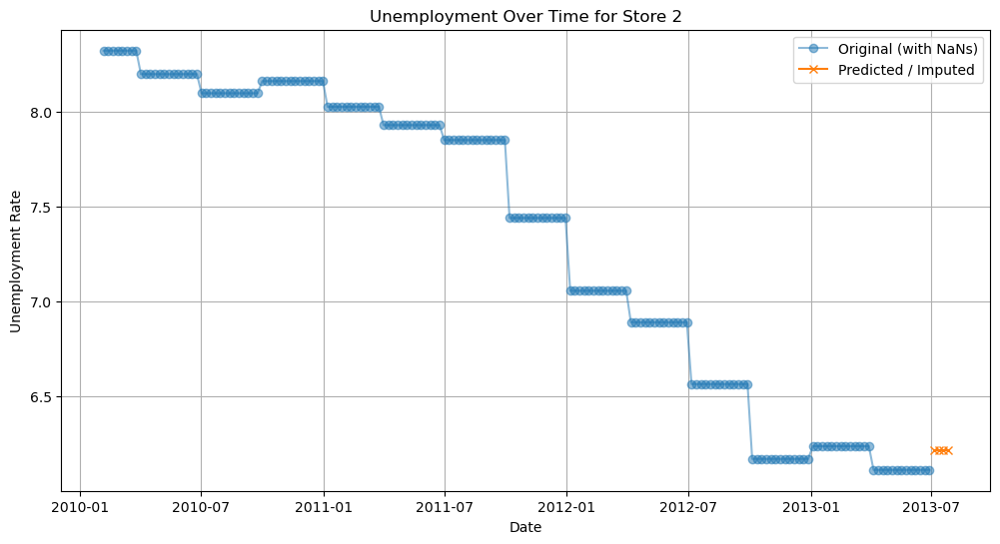

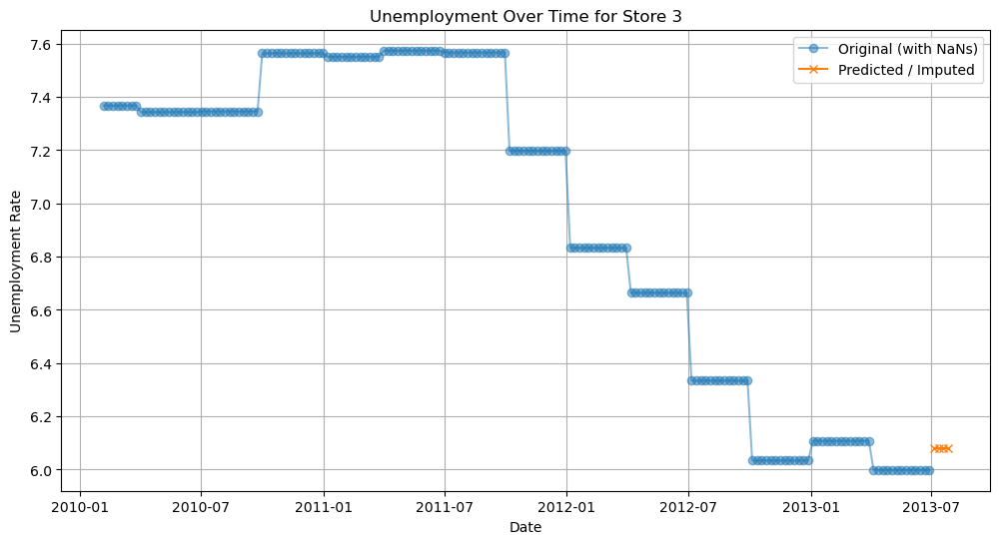

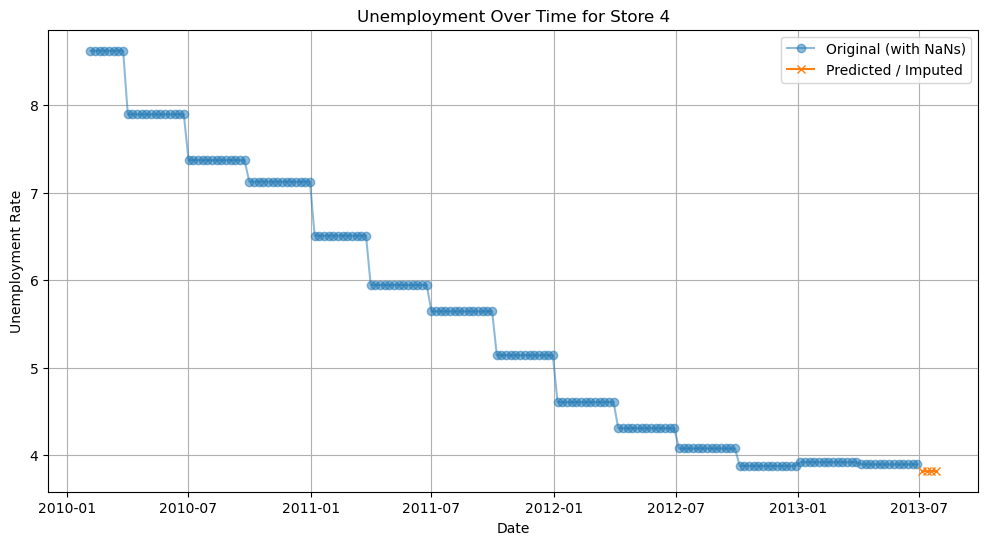

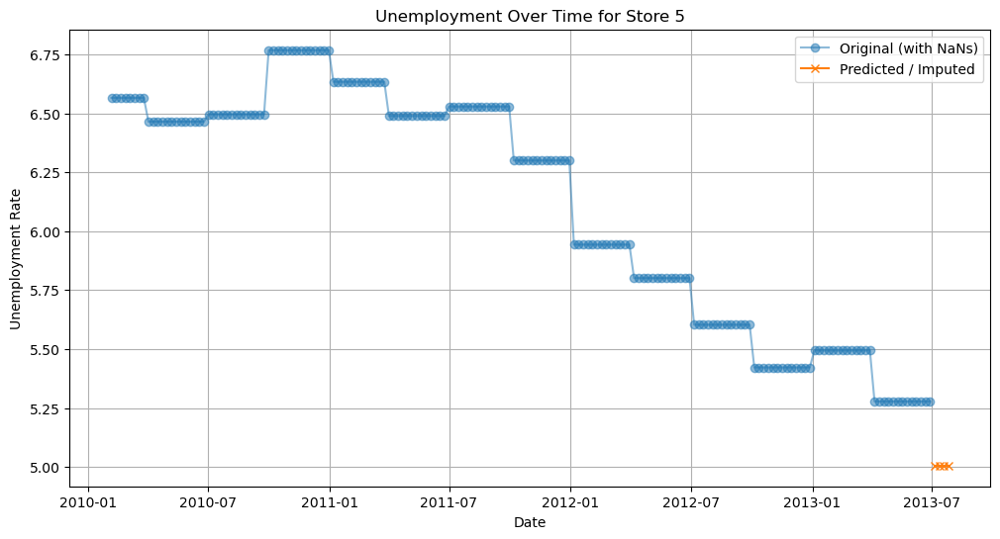

...

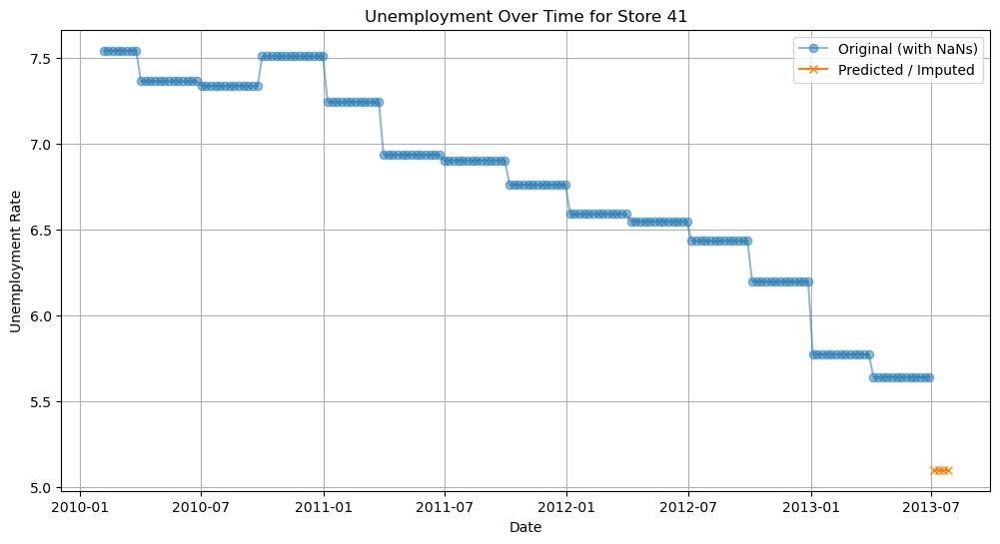

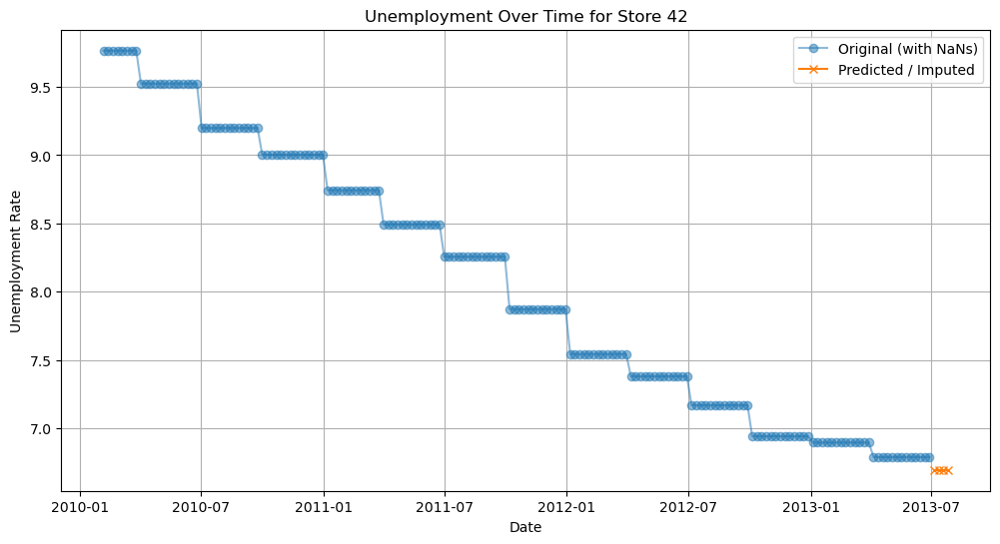

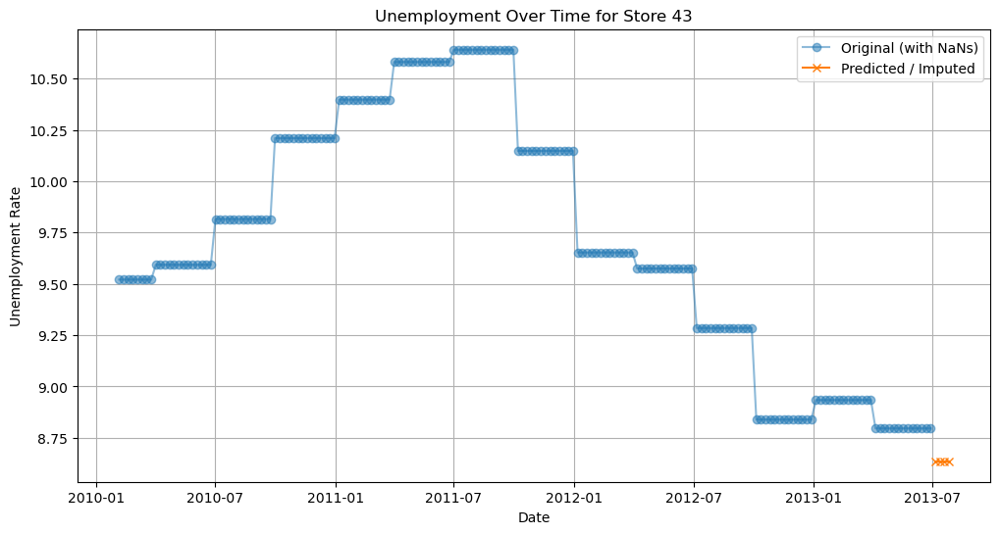

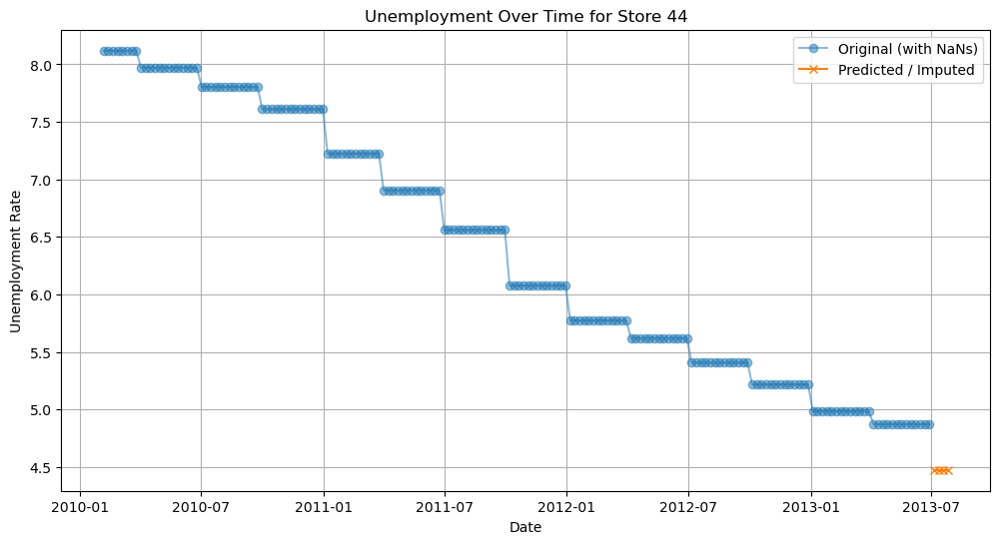

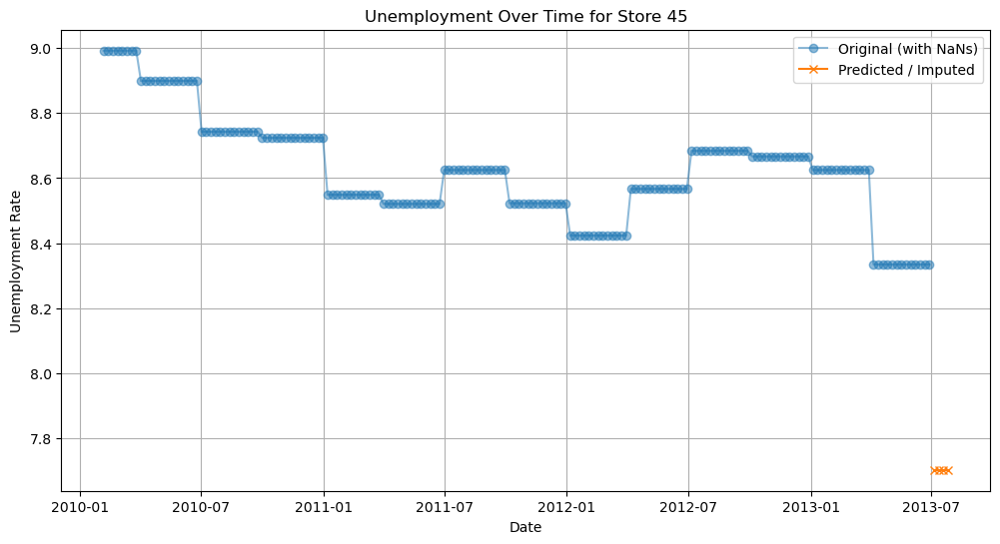

In [ ]:
import matplotlib.pyplot as plt

store_ids = sorted(features_stores_merged_df['store'].unique())

for id in store_ids:
    store_df = features_stores_merged_df[features_stores_merged_df["store"] == id]

    plt.figure(figsize=(12, 6))

    plt.plot(store_df["date"], store_df["unemployment"], label="Original (with NaNs)", marker="o",alpha=0.5)
    plt.plot(store_df["date"], store_df["unemployment_pred"], label="Predicted / Imputed", marker="x")

    plt.title(f"Unemployment Over Time for Store {id}")
    plt.xlabel("Date")
    plt.ylabel("Unemployment Rate")
    plt.legend()
    plt.grid(True)
    plt.show()


In [ ]:
features_stores_merged_df.isna().sum()

store                    0
date                     0
temperature              0
fuel_price               0
markdown1                0
markdown2                0
markdown3                0
markdown4                0
markdown5                0
total_markdown           0
cpi                      0
unemployment           180
isholiday                0
max_weekly_sales      1755
markdown_available       0
type                     0
size                     0
cpi_diff               630
unemployment_ff          0
quarter                  0
unemployment_pred     8010
dtype: int64

In [ ]:
features_stores_merged_df.notna().sum()

store                 8190
date                  8190
temperature           8190
fuel_price            8190
markdown1             8190
markdown2             8190
markdown3             8190
markdown4             8190
markdown5             8190
total_markdown        8190
cpi                   8190
unemployment          8010
isholiday             8190
max_weekly_sales      6435
markdown_available    8190
type                  8190
size                  8190
cpi_diff              7560
unemployment_ff       8190
quarter               8190
unemployment_pred      180
dtype: int64

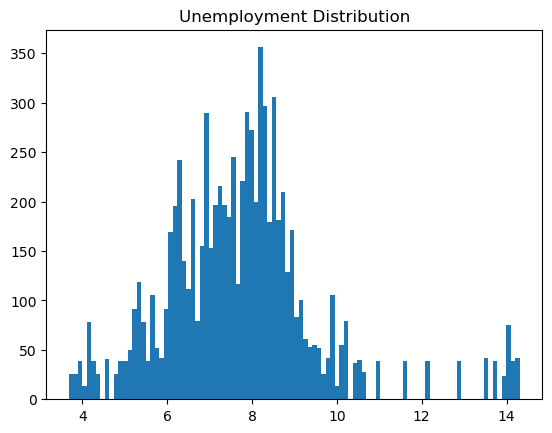

In [ ]:
plt.hist(features_stores_merged_df['unemployment'],bins=100)
plt.title("Unemployment Distribution")
plt.show()

#### We verified our whole and it is resulting in no null values once we implute the values from Unemployment_pred feature column to Unemployment feature column

#### Now its time to officially impute the predicted values to the null values of the Unemployment feature column

In [ ]:
features_stores_merged_df.head()

,store,date,temperature,fuel_price,markdown1,markdown2,markdown3,markdown4,markdown5,total_markdown,...,unemployment,isholiday,max_weekly_sales,markdown_available,type,size,cpi_diff,unemployment_ff,quarter,unemployment_pred
0,1,2010-02-05,42.31,2.572,0.0,0.0,0.0,0.0,0.0,0.0,...,8.106,False,139884.94,0,A,151315,NaN,8.106,2010Q1,NaN
1,1,2010-02-12,38.51,2.548,0.0,0.0,0.0,0.0,0.0,0.0,...,8.106,True,143081.42,0,A,151315,0.145812,8.106,2010Q1,NaN
2,1,2010-02-19,39.93,2.514,0.0,0.0,0.0,0.0,0.0,0.0,...,8.106,False,135066.75,0,A,151315,0.046973,8.106,2010Q1,NaN
3,1,2010-02-26,46.63,2.561,0.0,0.0,0.0,0.0,0.0,0.0,...,8.106,False,125048.08,0,A,151315,0.030500,8.106,2010Q1,NaN
4,1,2010-03-05,46.50,2.625,0.0,0.0,0.0,0.0,0.0,0.0,...,8.106,False,132945.44,0,A,151315,0.030500,8.106,2010Q1,NaN


In [ ]:
features_stores_merged_df.isna().sum()

store                    0
date                     0
temperature              0
fuel_price               0
markdown1                0
markdown2                0
markdown3                0
markdown4                0
markdown5                0
total_markdown           0
cpi                      0
unemployment           180
isholiday                0
max_weekly_sales      1755
markdown_available       0
type                     0
size                     0
cpi_diff               630
unemployment_ff          0
quarter                  0
unemployment_pred     8010
dtype: int64

In [ ]:
features_stores_merged_df=features_stores_merged_df.sort_values(by=['store','date']).reset_index(drop=True)
features_stores_merged_df['unemployment']=features_stores_merged_df['unemployment'].fillna(features_stores_merged_df['unemployment_pred'])
features_stores_merged_df.isna().sum()

store                    0
date                     0
temperature              0
fuel_price               0
markdown1                0
markdown2                0
markdown3                0
markdown4                0
markdown5                0
total_markdown           0
cpi                      0
unemployment             0
isholiday                0
max_weekly_sales      1755
markdown_available       0
type                     0
size                     0
cpi_diff               630
unemployment_ff          0
quarter                  0
unemployment_pred     8010
dtype: int64

In [ ]:
features_stores_merged_df.drop(columns=['CPI_imputed_linear','cpi_imputed_poly','unemployment_ff','unemployment_pred'],inplace=True)
features_stores_merged_df.isna().sum()

KeyError: "['CPI_imputed_linear', 'cpi_imputed_poly'] not found in axis"

In [ ]:
dataset_train.isna().sum()

store           0
dept            0
date            0
weekly_sales    0
isholiday       0
dtype: int64

#### We can probably feature engineer IsHoliday feature column into respective holidays but first lets check which day is coming under the case where the stores experience holidays

In [ ]:
dataset_features['date'] = pd.to_datetime(dataset_features['date'])
holiday_dates = dataset_features['date']
day_names = holiday_dates.dt.day_name().unique()
print(day_names)

['Friday']


In [ ]:
dataset_features['date'] = pd.to_datetime(dataset_features['date'])
holiday_dates = dataset_features[dataset_features['isholiday'] == True]['date']
holiday_weekdays = holiday_dates.dt.day_name().unique()
print(holiday_weekdays)

['Friday']


In [ ]:
dataset_features[dataset_features['isholiday']==True].shape

(585, 15)

In [ ]:
dataset_features['date'] = pd.to_datetime(dataset_features['date'])
holiday_dates = dataset_features[dataset_features['isholiday'] == True]['date'].dt.date.unique()
print(holiday_dates)

[datetime.date(2010, 2, 12) datetime.date(2010, 9, 10)
 datetime.date(2010, 11, 26) datetime.date(2010, 12, 31)
 datetime.date(2011, 2, 11) datetime.date(2011, 9, 9)
 datetime.date(2011, 11, 25) datetime.date(2011, 12, 30)
 datetime.date(2012, 2, 10) datetime.date(2012, 9, 7)
 datetime.date(2012, 11, 23) datetime.date(2012, 12, 28)
 datetime.date(2013, 2, 8)]


In [ ]:
dataset_stores.isna().sum()

store    0
type     0
size     0
dtype: int64

#### Analysis of dataset_stores starts

In [ ]:
dataset_stores.shape

(45, 3)

In [ ]:
dataset_stores['store'].unique().shape

(45,)

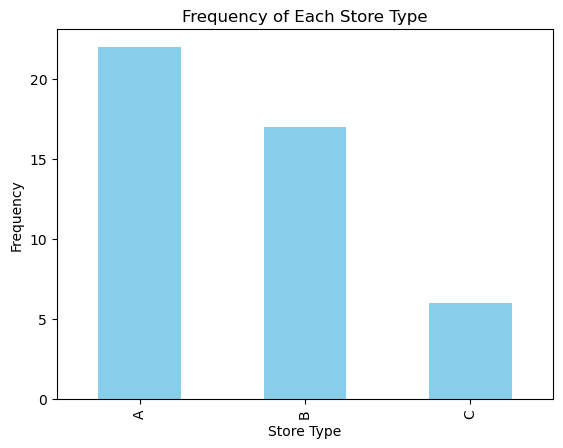

In [ ]:
import matplotlib.pyplot as plt

# Count frequencies
type_counts = dataset_stores['type'].value_counts()

# Plot
type_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Store Type')
plt.ylabel('Frequency')
plt.title('Frequency of Each Store Type')
plt.show()


In [ ]:
print(dataset_stores.describe())
dataset_stores.shape

           store           size
count  45.000000      45.000000
mean   23.000000  130287.600000
std    13.133926   63825.271991
min     1.000000   34875.000000
25%    12.000000   70713.000000
50%    23.000000  126512.000000
75%    34.000000  202307.000000
max    45.000000  219622.000000


(45, 3)

In [ ]:
dataset_stores.dtypes

store     int64
type     object
size      int64
dtype: object

In [ ]:
dataset_stores['type'].unique()

array(['A', 'B', 'C'], dtype=object)

In [ ]:
len(dataset_stores['size'].unique())

40

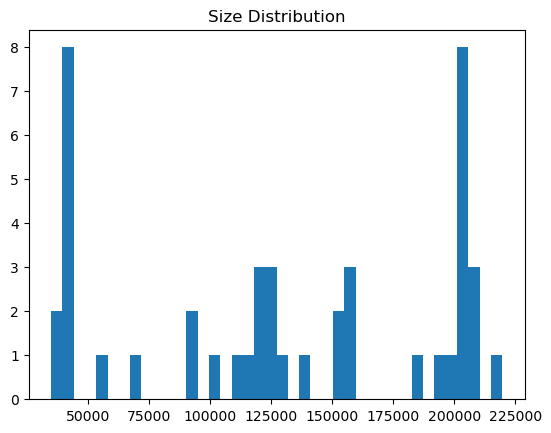

In [ ]:
plt.hist(dataset_stores['size'],bins=dataset_stores['size'].unique().shape[0])
plt.title("Size Distribution")
plt.show()

#### Assumption: There are 2 gaps appearing in the distribution of the Size feature column(one at 75000 and another at 175000). Our assumption is that it is related to the Type feature column as it contains 3 unique values. Lets verify it

In [ ]:
for val in dataset_stores['type'].unique():
    print(f"Min and max values of Size for store type {val}:",dataset_stores[dataset_stores['type']==val]['size'].min(),dataset_stores[dataset_stores['type']==val]['size'].max())

Min and max values of Size for store type A: 39690 219622
Min and max values of Size for store type B: 34875 140167
Min and max values of Size for store type C: 39690 42988


#### The assumption was false related to type feature column acting as a bucketing column for size feature column

#### Now lets store these datasets into some files for eda and feature extraction phase

In [ ]:
import os
import dotenv
import psycopg2
import pandas as pd
from io import StringIO

# --- Load environment variables ---
dotenv.load_dotenv()

# --- DB connection ---
conn = psycopg2.connect(
    host=os.getenv("DB_HOST"),
    database=os.getenv("DB_NAME"),
    user=os.getenv("DB_USERNAME"),
    password=os.getenv("DB_PASSWORD"),
    port=os.getenv("DB_PORT")
)

cursor = conn.cursor()

In [ ]:
cursor = conn.cursor()

cursor.execute("""
CREATE SCHEMA IF NOT EXISTS clean;
""")

conn.commit()
cursor.close()

print("Schema 'clean' ready.")


Schema 'clean' ready.


In [ ]:
from io import StringIO

def copy_from_df(conn, df, table_name, schema="clean"):
    
    buffer = StringIO()
    df.to_csv(buffer, index=False, header=False)
    buffer.seek(0)

    cursor = conn.cursor()

    cursor.copy_expert(
        f"""
        COPY {schema}.{table_name}
        FROM STDIN WITH (
            FORMAT CSV
        )
        """,
        buffer
    )

    conn.commit()
    cursor.close()

    print(f"Loaded {schema}.{table_name} successfully.")


In [ ]:
cursor = conn.cursor()

cursor.execute("""

-- ==============================
-- Create CLEAN schema
-- ==============================

CREATE SCHEMA IF NOT EXISTS clean;

-- ==============================
-- Drop existing tables (reset)
-- ==============================

DROP TABLE IF EXISTS clean.train;
DROP TABLE IF EXISTS clean.features_stores_merged;

-- ==============================
-- Train table
-- ==============================

CREATE TABLE clean.train (
    store INT,
    dept INT,
    date DATE,
    weekly_sales FLOAT,
    isholiday BOOLEAN
);

-- ==============================
-- Features + Stores merged table
-- (Aligned to DataFrame columns)
-- ==============================

CREATE TABLE clean.features_stores_merged (

    store INT,
    date DATE,

    temperature FLOAT,
    fuel_price FLOAT,

    markdown1 FLOAT,
    markdown2 FLOAT,
    markdown3 FLOAT,
    markdown4 FLOAT,
    markdown5 FLOAT,

    total_markdown FLOAT,

    cpi FLOAT,
    unemployment FLOAT,

    isholiday BOOLEAN,

    max_weekly_sales FLOAT,

    markdown_available INT,

    type TEXT,
    size INT,

    quarter VARCHAR
);

""")

conn.commit()
cursor.close()

print("Clean schema + tables ready.")

Clean schema + tables ready.


In [ ]:
copy_from_df(conn, dataset_train_full, "train", schema="clean")
copy_from_df(conn, features_stores_merged_df, "features_stores_merged", schema="clean")


Loaded clean.train successfully.


BadCopyFileFormat: extra data after last expected column
CONTEXT:  COPY features_stores_merged, line 1: "1,2010-02-05,42.31,2.572,0.0,0.0,0.0,0.0,0.0,0.0,211.0963582,8.106,False,139884.94,0,A,151315,,2010Q..."


#### Now you can go ahead to notebooks/eda.ipynb for furthur reviewing the project